In [ ]:
"""
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8n-pose.yaml')  # build a new model from YAML
model = YOLO('yolov8n-pose.pt')  # load a pretrained model (recommended for training)
model = YOLO('yolov8n-pose.yaml').load('yolov8n-pose.pt')  # build from YAML and transfer weights

# Train the model
results = model.train(data='coco8-pose.yaml', epochs=100, imgsz=640)

In [ ]:
!pip install ultralytic

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.215 🚀 Python-3.10.12 torch-2.1.0+cu118 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.9/107.7 GB disk)


In [ ]:
"""
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8n-pose.pt')  # load an official model
model = YOLO('path/to/best.pt')  # load a custom trained model

# Export the model
model.export(format='onnx')

In [ ]:
from ultralytics import YOLO
import cv2

# Load a model
model = YOLO('yolov8n-pose.pt')  # load an official model
#model = YOLO('path/to/best.pt')  # load a custom model

100%|██████████| 6.51M/6.51M [00:00<00:00, 118MB/s]


In [ ]:
# Predict with the model
results = model('https://ultralytics.com/images/bus.jpg', save=True, imgsz=320, conf=0.5)   # predict on an image

100%|██████████| 476k/476k [00:00<00:00, 14.1MB/s]


image 1/1 /content/bus.jpg: 320x256 3 persons, 149.5ms
Speed: 12.3ms preprocess, 149.5ms inference, 24.5ms postprocess per image at shape (1, 3, 320, 256)
Results saved to runs/pose/predict


In [ ]:
from PIL import Image

# Process results
for r in results:
  im_array = r.plot()  # plot a BGR numpy array of predictions
  im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
  im.show()  # show image
  im.save("result_pose.jpg")  # save image

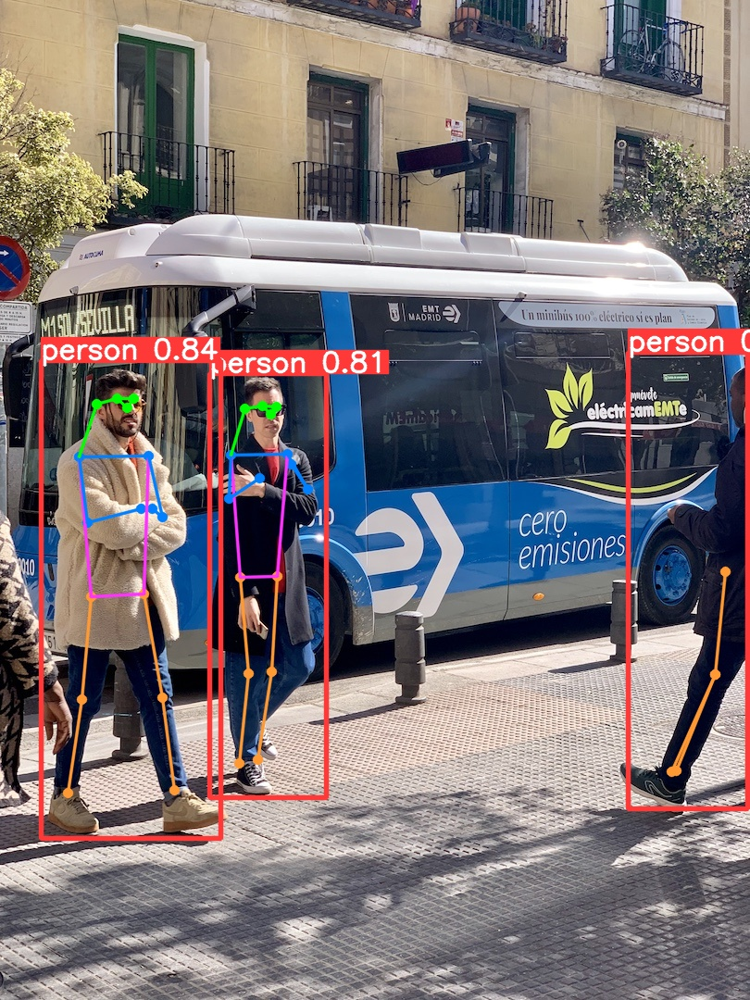

In [ ]:
from ultralytics import YOLO
from IPython.display import display, Image

Image(filename='runs/pose/predict/bus.jpg', height=600)

In [ ]:
from ultralytics import YOLO
from PIL import Image
import cv2

image = "/content/bus.jpg"

# Predict with the model
results = model(image, save=True, imgsz=320, conf=0.5)

k = 0
for result in results:
  frame = cv2.imread(image)
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
    keypoint = kpts.xy[0, i]
    x, y = int(keypoint[0].item()), int(keypoint[1].item())
    cv2.circle(frame, (x, y), 5, (0, 255, 0), -1)

  k = k + 1
  im = Image.fromarray(frame[..., ::-1])  # RGB PIL image
  im.show()  # show image
  im.save("person_pose_"+str(k)+".jpg")  # save image


image 1/1 /content/bus.jpg: 320x256 3 persons, 38.0ms
Speed: 0.8ms preprocess, 38.0ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 256)
Results saved to runs/pose/predict


In [ ]:
from ultralytics import YOLO
from PIL import Image
import cv2
import os

image = "/content/bus.jpg"
dir_keypoints = "keypoints"
os.makedirs(dir_keypoints, exist_ok=True)

# Predict with the model
results = model(image, save=True, imgsz=320, conf=0.5)

k = 0
for result in results[0]:
  frame = cv2.imread(image)
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
    keypoint = kpts.xy[0, i]
    x, y = int(keypoint[0].item()), int(keypoint[1].item())
    cv2.circle(frame, (x, y), 5, (0, 255, 0), -1)

  k = k + 1
  im = Image.fromarray(frame[..., ::-1])  # RGB PIL image
  im.show()  # show image
  im.save(dir_keypoints+"/person_pose_"+str(k)+".jpg")  # save image


image 1/1 /content/bus.jpg: 320x256 3 persons, 36.7ms
Speed: 0.8ms preprocess, 36.7ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 256)
Results saved to runs/pose/predict


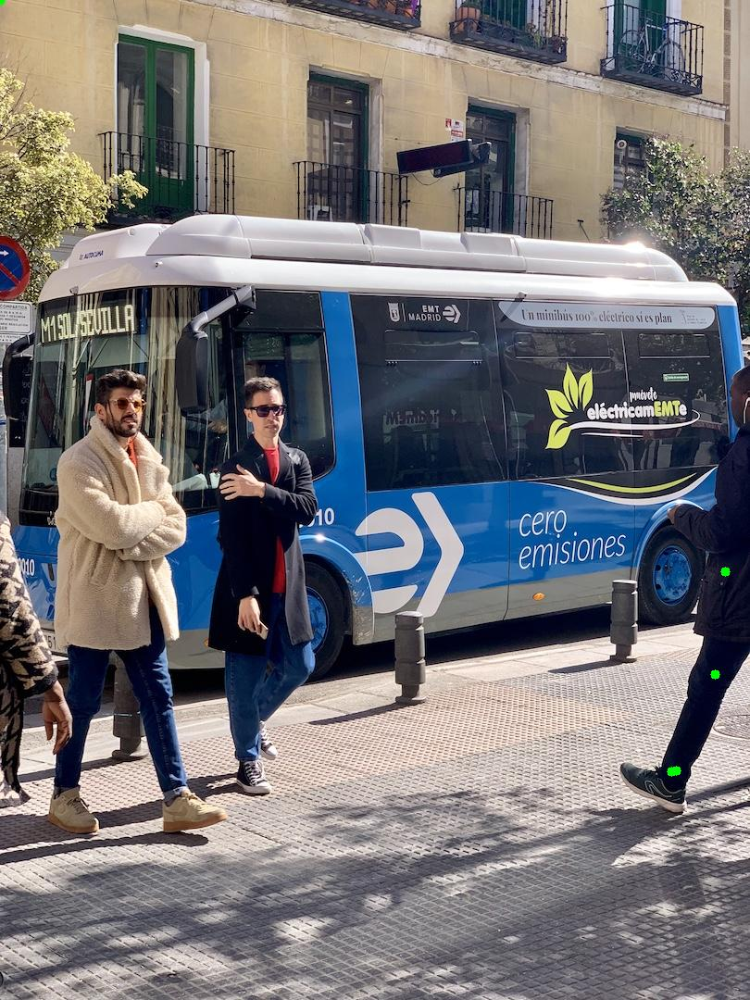

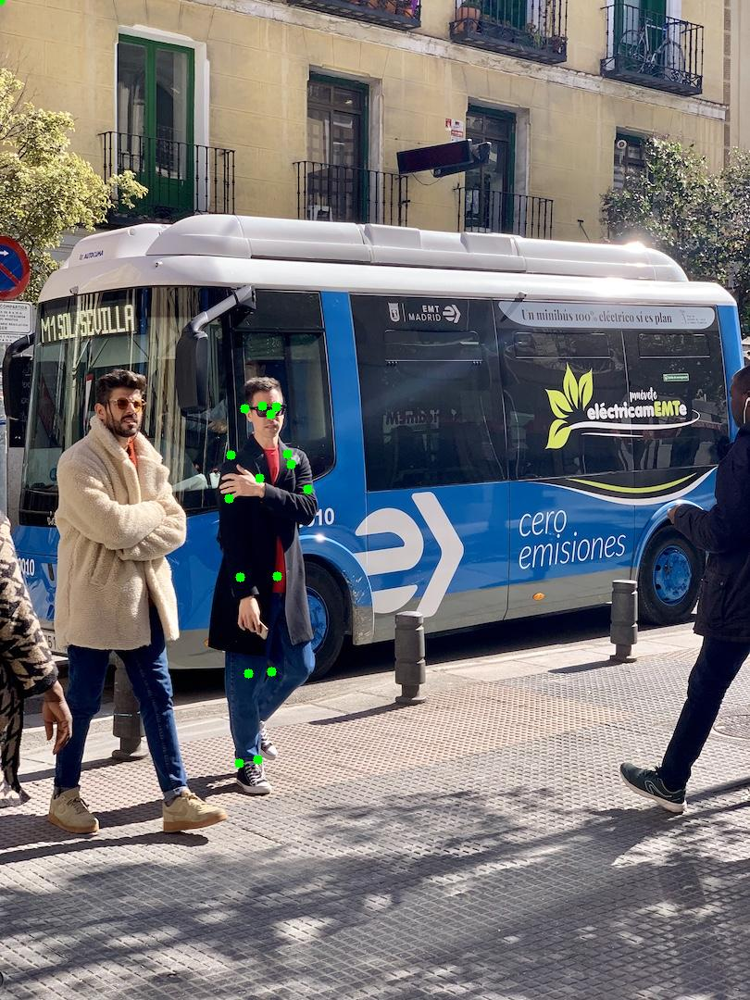

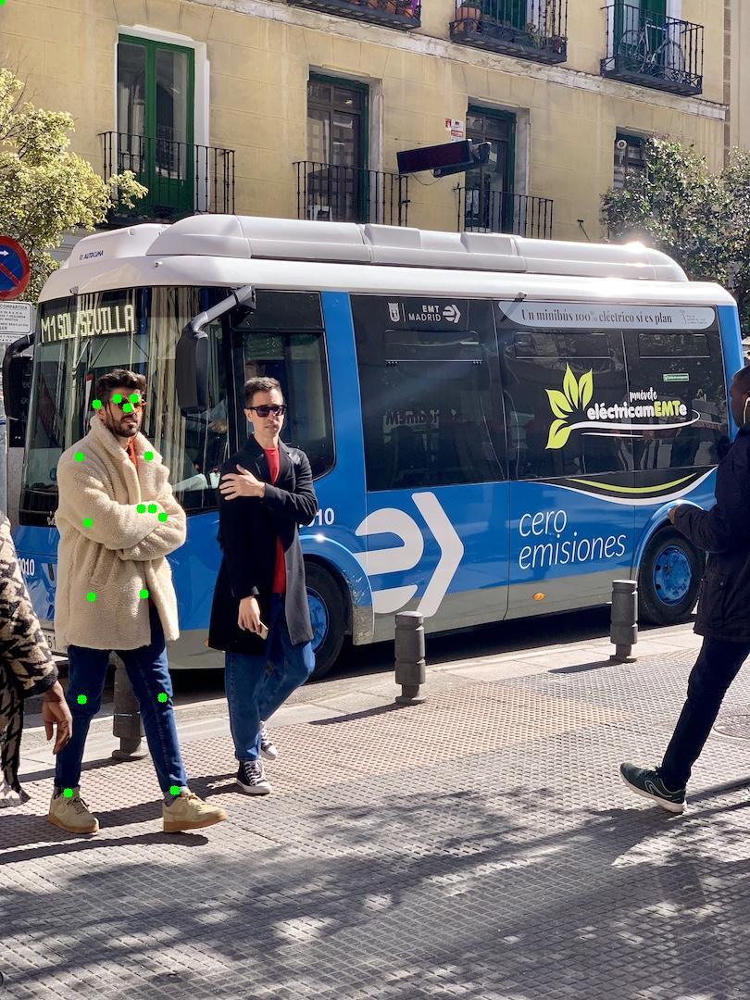

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'./keypoints/*.jpg')[:10]:
  display(Image(filename=image_path, width=400))
  print("\n")

In [ ]:
!pip install -U git+https://github.com/ytdl-org/youtube-dl.git

  Cloning https://github.com/ytdl-org/youtube-dl.git to /tmp/pip-req-build-r7hyov78
  Running command git clone --filter=blob:none --quiet https://github.com/ytdl-org/youtube-dl.git /tmp/pip-req-build-r7hyov78
  Resolved https://github.com/ytdl-org/youtube-dl.git to commit 00ef748cc0e35ee60efd0f7a00e373ab8d1af86b
  Preparing metadata (setup.py) ... done
  Created wheel for youtube-dl: filename=youtube_dl-2021.12.17-py2.py3-none-any.whl size=1940306 sha256=2dec7989dfc2565a8814c808bd227d03bde132c6344b89a50afc0d411f07ff87
  Stored in directory: /tmp/pip-ephem-wheel-cache-rut34p_5/wheels/64/8e/40/866e846163e3e4859bbe820ff8847ec97f4320864f1525aa9a
Successfully built youtube-dl


In [ ]:
import torch
import os
import pathlib
import re
from imutils import paths
from IPython.display import YouTubeVideo
from IPython.display import Image, display

In [ ]:
# @title Code for downloading YouTube Videos
def extract_video_id(youtube_url):
    """
    Extract the video ID from a given YouTube URL.

    Args:
    - youtube_url (str): The full URL of the YouTube video.

    Returns:
    - str: The extracted video ID.
    """
    # Standard format: https://www.youtube.com/watch?v=VIDEO_ID
    match = re.search(r'v=([A-Za-z0-9_-]+)', youtube_url)
    if match:
        return match.group(1)

    # Shortened format: https://youtu.be/VIDEO_ID
    match = re.search(r'youtu\.be/([A-Za-z0-9_-]+)', youtube_url)
    if match:
        return match.group(1)

    # YouTube shorts format: https://www.youtube.com/shorts/VIDEO_ID
    match = re.search(r'/shorts/([A-Za-z0-9_-]+)', youtube_url)
    if match:
        return match.group(1)

    raise ValueError("Invalid YouTube URL")

def process_video(youtube_url, output_filename="download.mp4"):
    """
    Display the video, download it, and save it with the provided filename.

    Args:
    - youtube_url (str): The full URL of the YouTube video.
    - output_filename (str, optional): The name of the file to save the video as. Defaults to "download.mp4".
    """
    video_id = extract_video_id(youtube_url)

    # Display the video
    video = YouTubeVideo(video_id)
    display(video)

    # Download the video
    video_url = f'https://www.youtube.com/watch?v={video_id}'
    !python -m youtube_dl -f 'bestvideo[ext=mp4]+bestaudio[ext=m4a]/mp4' "$video_url" -o "$output_filename"
    print(f'Video downloaded successfully as {output_filename}')

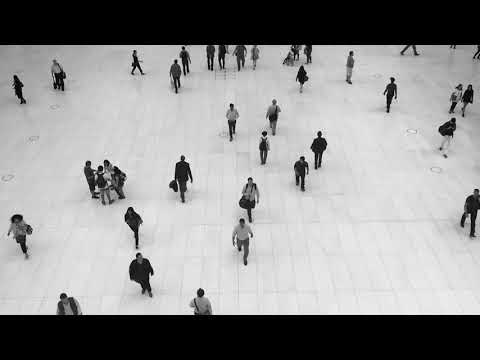

[youtube] WvhYuDvH17I: Downloading webpage
[youtube] WvhYuDvH17I: Downloading player 190c935f
[dashsegments] Total fragments: 1
[download] Destination: mass_walking_public.f136.mp4
[download] 100% of 1.77MiB in 00:00
[dashsegments] Total fragments: 1
[download] Destination: mass_walking_public.mp4.f140
[download] 100% of 217.24KiB in 00:00
[ffmpeg] Merging formats into "mass_walking_public.mp4"
Deleting original file mass_walking_public.f136.mp4 (pass -k to keep)
Deleting original file mass_walking_public.mp4.f140 (pass -k to keep)
Video downloaded successfully as mass_walking_public.mp4


In [ ]:
# Example usage:
youtube_url = 'https://www.youtube.com/watch?v=WvhYuDvH17I'
video_name = "mass_walking_public.mp4"
process_video(youtube_url, video_name)

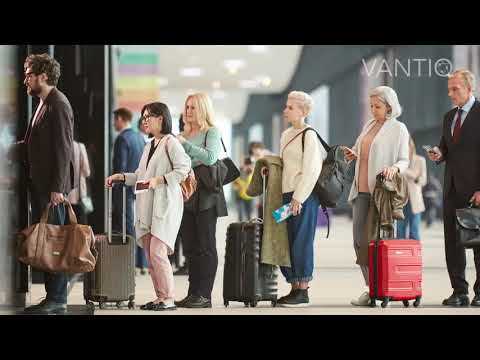

[youtube] udkKHjX_qBM: Downloading webpage
[dashsegments] Total fragments: 2
[download] Destination: vantiq_queuing.f136.mp4
[download] 100% of 11.35MiB in 00:03
[dashsegments] Total fragments: 1
[download] Destination: vantiq_queuing.mp4.f140
[download] 100% of 1.26MiB in 00:00
[ffmpeg] Merging formats into "vantiq_queuing.mp4"
Deleting original file vantiq_queuing.f136.mp4 (pass -k to keep)
Deleting original file vantiq_queuing.mp4.f140 (pass -k to keep)
Video downloaded successfully as vantiq_queuing.mp4


In [ ]:
# Example usage: https://www.youtube.com/watch?v=yEgc43y-rWw
youtube_url = 'https://www.youtube.com/watch?v=udkKHjX_qBM'
video_name = "vantiq_queuing.mp4"
process_video(youtube_url, video_name)

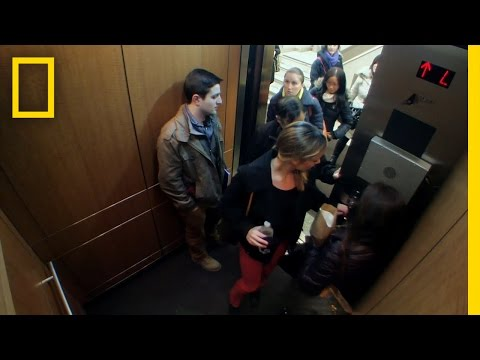

[youtube] J930Rut_J6E: Downloading webpage
[dashsegments] Total fragments: 3
[download] Destination: Elevator_of_Shame_Crowd_Control.f137.mp4
[download] 100% of 26.77MiB in 00:01
[dashsegments] Total fragments: 1
[download] Destination: Elevator_of_Shame_Crowd_Control.mp4.f140
[download] 100% of 2.76MiB in 00:00
[ffmpeg] Merging formats into "Elevator_of_Shame_Crowd_Control.mp4"
Deleting original file Elevator_of_Shame_Crowd_Control.f137.mp4 (pass -k to keep)
Deleting original file Elevator_of_Shame_Crowd_Control.mp4.f140 (pass -k to keep)
Video downloaded successfully as Elevator_of_Shame_Crowd_Control.mp4


In [ ]:
# Example usage:
youtube_url = 'https://www.youtube.com/watch?v=J930Rut_J6E'
video_name = "Elevator_of_Shame_Crowd_Control.mp4"
process_video(youtube_url, video_name)

In [ ]:
# @title Run this cell for prediction function
def make_prediction(input_file, action, confidence=0.55):
    """
    Make a prediction using the fixed model and device, and either show or save the result.

    Args:
    - input_file (str): Path to the input file.
    - action (str): Either 'show' or 'save'.
    - confidence (float, optional): Confidence threshold. Defaults to 0.75.

    Returns:
    - None

    Raises:
    - ValueError: If the action is not 'show' or 'save'.
    """
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    if action == "show":
      model.to(device).predict(input_file, conf=confidence).show()
    elif action == "save":
      output_file = pathlib.Path(input_file).stem + "-detections" + pathlib.Path(input_file).suffix
      model.to(device).predict(input_file, conf=confidence).save(output_file)
      print(f"Prediction saved to {output_file}")
    else:
      raise ValueError("Action must be either 'show' or 'save'.")

In [ ]:
make_prediction("/content/mass_walking_public.mp4", "save")

In [ ]:
from ultralytics import YOLO
import cv2

# Load a model
model = YOLO('yolov8n-pose.pt')  # load an official model
#model = YOLO('path/to/best.pt')  # load a custom model

In [ ]:
results = model.predict('mass_walking_public.mp4', conf=0.60).save("mass-walking-detections.mp4")

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8n-pose.pt')  # load an official model

# input video path
input_path = "/content/input_vids/mass_walking_public.mp4"

# output directory
output_dir = "/content/output_vids"
dir_keypoints = "keypoints"
os.makedirs("input_vids", exist_ok=True)
os.makedirs("output_vids", exist_ok=True)

results = model.predict(source=input_path, conf=0.45, project=output_dir, save=True)

# Save annotated frames to the output directory
#results.save(save_dir = input_path)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (1/341) /content/input_vids/mass_walking_public.mp4: 384x640 6 persons, 336.8ms
video 1/1 (2/341) /content/input_vids/mass_walking_public.mp4: 384x640 6 persons, 216.9ms
video 1/1 (3/341) /content/input_vids/mass_walking_public.mp4: 384x640 6 persons, 220.8ms
video 1/1 (4/341) /content/input_vids/mass_walking_public.mp4: 384x640 6 persons, 218.4ms
video 1/1 (5/341) /content/input_vids/mass_walking_public.mp4: 384x640 5 persons, 217.0ms
video 

In [ ]:
# @title Code for creating skeleton images/videos
import matplotlib.pyplot as plt
import numpy as np
import cv2

# @title Run this cell for prediction function
def make_prediction(input_file, action, confidence=0.55):
    """
    Make a prediction using the fixed model and device, and either show or save the result.

    Args:
    - input_file (str): Path to the input file.
    - action (str): Either 'show' or 'save'.
    - confidence (float, optional): Confidence threshold. Defaults to 0.75.

    Returns:
    - None

    Raises:
    - ValueError: If the action is not 'show' or 'save'.
    """
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    if action == "show":
        model.to(device).predict(input_file, conf=confidence).show()
    elif action == "save":
        output_file = pathlib.Path(input_file).stem + "-detections" + pathlib.Path(input_file).suffix
        model.to(device).predict(input_file, conf=confidence).save(output_file)
        print(f"Prediction saved to {output_file}")
    else:
        raise ValueError("Action must be either 'show' or 'save'.")

def process_single_image(image_prediction):
    """
    Process a single image prediction to visualize the pose estimation results on a blank background.

    Parameters:
    - image_prediction : object
        An instance containing the image and its associated pose prediction data.

    Returns:
    - np.ndarray
        An image with the pose skeleton drawn.
    """

    image = image_prediction.image
    pose_data = image_prediction.prediction

    blank_image = np.zeros_like(image)  # for a black background

    skeleton_image = PoseVisualization.draw_poses(
        image=blank_image,
        poses=pose_data.poses,
        boxes=pose_data.bboxes_xyxy,
        scores=pose_data.scores,
        is_crowd=None,
        edge_links=pose_data.edge_links,
        edge_colors=pose_data.edge_colors,
        keypoint_colors=pose_data.keypoint_colors,
        joint_thickness=2,
        box_thickness=2,
        keypoint_radius=5
    )
    return skeleton_image

def create_video_from_frames(frames, output_filename='output_video.mp4', fps=30.0):
    """
    Create an mp4 video from a list of image frames.

    Parameters:
    - frames : list of np.ndarray
        List of image frames represented as numpy arrays.
    - output_filename : str, optional
        Name of the output video file.
    - fps : float, optional
        Frames per second for the output video.

    Returns:
    - None
    """

    # Determine the width and height from the first frame
    frame_height, frame_width, layers = frames[0].shape

    # Define the codec for .mp4 format
    fourcc = cv2.VideoWriter_fourcc(*'MP4V')
    out = cv2.VideoWriter(output_filename, fourcc, fps, (frame_width, frame_height))

    # Write each frame to the video
    for frame in frames:
        out.write(frame)

    # Close and release everything
    out.release()
    cv2.destroyAllWindows()

In [ ]:
!pip install supervision

In [ ]:
from ultralytics import YOLO
import cv2
import argparse
#import supervision as sv
from PIL import Image
import imageio
import time

weights_path = "yolov8n-pose.pt"
vid_path = "mass_walking_public.mp4"
frame_width, frame_height = 300, 300

capture = cv2.VideoCapture(vid_path)
#capture.set(cv2.CAP_PROP_FRAME_WIDTH, frame_width)
#capture.set(cv2.CAP_PROP_FRAME_HEIGHT, frame_height)
writer = imageio.get_writer("output23.mp4", mode="I")

# Load a model
model = YOLO(weights_path)
frames = []

while capture.isOpened():
  ret, frame = capture.read()
  if ret and frame.any():
    start_time = time.time()
    # Run YOLOv8 inference on the frame
    results = model(frame)

    # Visualize the results on the frame
    annotated_frame = results[0].plot()

    end_time = time.time()
    fps = 1 / (end_time - start_time)
    print("FPS :", fps)

    cv2.putText(annotated_frame, "FPS :"+str(int(fps)), (10, 50), cv2.FONT_HERSHEY_COMPLEX, 1.2, (255, 0, 255), 1, cv2.LINE_AA)

    # Display the annotated frame
    #cv2.imshow("YOLOv8 Inference", annotated_frame)

    annotated_frame = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)
    #writer.append_data(annotated_frame)
    frames.append(annotated_frame)
  else:
    # Break the loop if the end of the video is reached
    break

create_video_from_frames(frames, output_filename='output_video.mp4', fps=30.0)

100%|██████████| 6.51M/6.51M [00:00<00:00, 54.7MB/s]



0: 384x640 6 persons, 518.1ms
Speed: 22.0ms preprocess, 518.1ms inference, 41.3ms postprocess per image at shape (1, 3, 384, 640)
FPS : 0.3175911946537693

0: 384x640 8 persons, 241.9ms
Speed: 2.4ms preprocess, 241.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
FPS : 3.362517937741007

0: 384x640 8 persons, 231.6ms
Speed: 5.4ms preprocess, 231.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
FPS : 3.3645247251380925

0: 384x640 8 persons, 265.0ms
Speed: 4.3ms preprocess, 265.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
FPS : 3.1889785211936896

0: 384x640 9 persons, 250.1ms
Speed: 4.7ms preprocess, 250.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)
FPS : 3.318365115544947

0: 384x640 8 persons, 232.0ms
Speed: 3.9ms preprocess, 232.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
FPS : 3.5391177485619685

0: 384x640 8 persons, 251.6ms
Speed: 4.4ms preprocess, 251.6ms inference, 1

In [ ]:
create_video_from_frames(frames, output_filename='output_video.mp4', fps=30.0)

In [ ]:
from ultralytics import YOLO
import cv2
import argparse
#import supervision as sv
from PIL import Image
import imageio
import time
from datetime import datetime

weights_path = "yolov8n-pose.pt"
vid_path = "mass_walking_public.mp4"
#frame_width, frame_height = 300, 300

capture = cv2.VideoCapture(vid_path)
#capture.set(cv2.CAP_PROP_FRAME_WIDTH, frame_width)
#capture.set(cv2.CAP_PROP_FRAME_HEIGHT, frame_height)
#writer = imageio.get_writer("output23.mp4", mode="I")

# Load a model
model = YOLO(weights_path)
frames = []
results = None
frame_count = 0
start_time = time.time()

while capture.isOpened():
  ret, frame = capture.read()
  if ret:
  # Resize the image to the desired size using cv2.resize()
    #frame = cv2.resize(frame, (width, height))

    # Check if one second has passed since the last inference was applied
    if time.time() - start_time >= 0.5:
        # Run YOLOv8 inference on the frame
        results = model(frame)

        # Update the timer and frame counter
        start_time = time.time()
        #frame_count += 2

    # Visualize the results on the frame if they exist
    if results is not None:
        annotated_frame = results[0].plot()

        # Display the annotated frame
        #cv2.imshow("YOLOv8 Inference", annotated_frame)

        # Write the annotated frame to the output video file
        #out.write(annotated_frame)
        #writer.append_data(annotated_frame)
        frames.append(annotated_frame)

        P = 0
        try:
          # print keypoints index number and x,y coordinates
          for idx, kpt in enumerate(results[0].keypoints[0]):
            P = len(results[0])
            print(P, ' Persons Detected')
        except:
            print('No Persons')
            P = 0
        file_object = open('sample.txt', 'w')   # use append 'a' mode
        file_object.write(str(P) + ' Time: ' + str(datetime.now()))
        file_object.write("\n")
        file_object.close()

  else:
    # Break the loop if the end of the video is reached
    break

create_video_from_frames(frames, output_filename='output_video_1.mp4', fps=30.0)


0: 384x640 8 persons, 112.9ms
Speed: 2.2ms preprocess, 112.9ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected
8  Persons Detected

0: 384x640 7 persons, 91.9ms
Speed: 1.4ms preprocess, 91.9ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)
7  Persons Detected
7  Persons Detected
7  Persons Detected
7  Persons Detected
7  Persons Detected
7  Persons Detected
7  Persons Detected
7  Persons Detected
7  Persons Detected
7  Persons Detected
7  Persons Detected
7  P

In [ ]:
!wget -O dance.jpg 'https://miro.medium.com/v2/resize:fit:1100/format:webp/1*8KVz1ip4pFflqiDKhlzufQ.jpeg'

In [ ]:
from ultralytics.engine.results import Results
from ultralytics.utils.plotting import Annotator
results = model.predict("dance.jpg")[0]
frame = cv2.imread("dance.jpg")

keypoints = results.keypoints.xy.cpu().numpy()
keypoints = list(keypoints)
ann = Annotator(frame)
for i in range(len(keypoints[0])):
  kp = keypoints[0][i]
  x = int(kp[0])
  y = int(kp[1])
  ann.text((x, y), str(i))


image 1/1 /content/dance.jpg: 448x640 1 person, 566.8ms
Speed: 17.8ms preprocess, 566.8ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)


In [ ]:
from ultralytics.utils.plotting import Annotator
from PIL import Image

results = model.predict("dance.jpg")[0]
frame = cv2.imread("dance.jpg")
plotted_results = results[0].plot()

# save a image with the plotted results
cv2.imwrite("result.jpg", plotted_results)

ann = Annotator(frame, pil=False)
keypoints = results.keypoints.data
ann.kpts(keypoints)

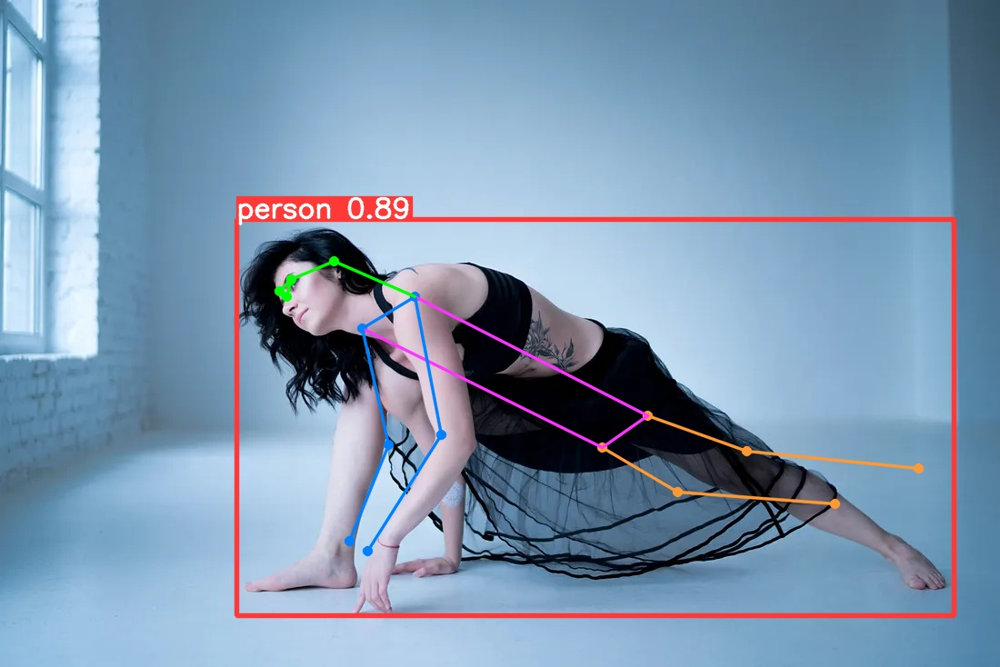

In [ ]:
frame = cv2.imread("result.jpg")
cv2_imshow(frame)

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread("yolov8-pose-athlete.jpg")
results = model.predict("yolov8-pose-athlete.jpg")[0]

landmarks = []
for result in results:
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
      keypoint = kpts.xy[0, i]
      x, y = int(keypoint[0].item()), int(keypoint[1].item())
      cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
      ttext = "("+str(x)+","+str(y)+")"
      cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX,
                   0.3, (0,0,0), 1, cv2.LINE_AA)

      landmarks.append([x,y])


image 1/1 /content/yolov8-pose-athlete.jpg: 640x320 1 person, 170.3ms
Speed: 2.6ms preprocess, 170.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 320)


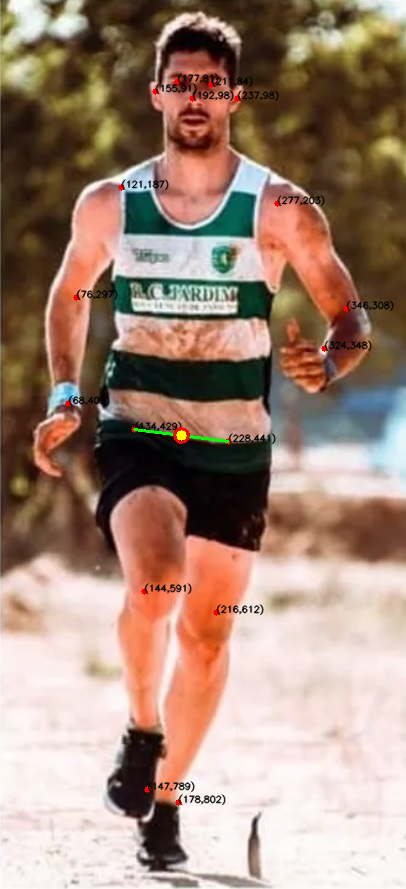

In [ ]:
cv2.line(img, landmarks[11], landmarks[12], (0,255,0), 2)
a = (landmarks[11][0] + landmarks[12][0])//2
b = (landmarks[11][1] + landmarks[12][1])//2
cv2.circle(img, (a, b), 5, (0, 255, 255), -1)
cv2.circle(img, (a, b), 7, (0, 0, 255), 2)

cv2_imshow(img)

In [ ]:
# import pandas as pd
import pandas as pd

# Calling DataFrame constructor on list
df = pd.DataFrame(landmarks, columns =['x', 'y'], dtype = float)
df

,x,y
0,192.0,98.0
1,211.0,84.0
2,177.0,81.0
3,237.0,98.0
4,155.0,91.0
5,277.0,203.0
6,121.0,187.0
7,346.0,308.0
8,76.0,297.0
9,324.0,348.0


In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8n-pose.pt')

# Predict with the model
results = model('dance.jpg')

# Extract keypoint
result_keypoint = results[0].keypoints.xyn.cpu().numpy()[0]
result_keypoint


image 1/1 /content/dance.jpg: 448x640 1 person, 114.2ms
Speed: 1.7ms preprocess, 114.2ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)


array([[    0.28647,      0.4455],
       [    0.29133,      0.4183],
       [    0.27947,     0.43687],
       [    0.33416,     0.39187],
       [          0,           0],
       [    0.41502,     0.44458],
       [      0.362,     0.49249],
       [    0.44146,      0.6524],
       [    0.38875,     0.66701],
       [    0.36816,     0.82645],
       [    0.34952,     0.81112],
       [    0.64798,     0.62272],
       [    0.60244,     0.67165],
       [    0.74641,     0.67661],
       [    0.67736,     0.73808],
       [    0.91895,     0.70204],
       [    0.83489,     0.75514]], dtype=float32)

In [ ]:
keypoints = results[0].keypoints
keypoints

ultralytics.engine.results.Keypoints object with attributes:

conf: tensor([[0.96593, 0.97794, 0.51757, 0.97691, 0.08434, 0.99955, 0.97837, 0.99877, 0.83013, 0.98202, 0.64985, 0.99800, 0.98958, 0.97945, 0.90793, 0.84954, 0.70904]])
data: tensor([[[3.15114e+02, 3.26994e+02, 9.65930e-01],
         [3.20462e+02, 3.07030e+02, 9.77938e-01],
         [3.07419e+02, 3.20666e+02, 5.17569e-01],
         [3.67574e+02, 2.87634e+02, 9.76910e-01],
         [0.00000e+00, 0.00000e+00, 8.43383e-02],
         [4.56525e+02, 3.26325e+02, 9.99551e-01],
         [3.98195e+02, 3.61484e+02, 9.78372e-01],
         [4.85611e+02, 4.78859e+02, 9.98769e-01],
         [4.27627e+02, 4.89587e+02, 8.30135e-01],
         [4.04978e+02, 6.06618e+02, 9.82018e-01],
         [3.84473e+02, 5.95363e+02, 6.49853e-01],
         [7.12782e+02, 4.57075e+02, 9.97999e-01],
         [6.62680e+02, 4.92989e+02, 9.89582e-01],
         [8.21051e+02, 4.96632e+02, 9.79449e-01],
         [7.45092e+02, 5.41748e+02, 9.07927e-01],
         [1.

In [ ]:
for r in results:
   print(r.keypoints.data)

tensor([[[3.1511e+02, 3.2699e+02, 9.6593e-01],
         [3.2046e+02, 3.0703e+02, 9.7794e-01],
         [3.0742e+02, 3.2067e+02, 5.1757e-01],
         [3.6757e+02, 2.8763e+02, 9.7691e-01],
         [0.0000e+00, 0.0000e+00, 8.4338e-02],
         [4.5653e+02, 3.2633e+02, 9.9955e-01],
         [3.9820e+02, 3.6148e+02, 9.7837e-01],
         [4.8561e+02, 4.7886e+02, 9.9877e-01],
         [4.2763e+02, 4.8959e+02, 8.3013e-01],
         [4.0498e+02, 6.0662e+02, 9.8202e-01],
         [3.8447e+02, 5.9536e+02, 6.4985e-01],
         [7.1278e+02, 4.5708e+02, 9.9800e-01],
         [6.6268e+02, 4.9299e+02, 9.8958e-01],
         [8.2105e+02, 4.9663e+02, 9.7945e-01],
         [7.4509e+02, 5.4175e+02, 9.0793e-01],
         [1.0108e+03, 5.1529e+02, 8.4954e-01],
         [9.1838e+02, 5.5427e+02, 7.0904e-01]]])


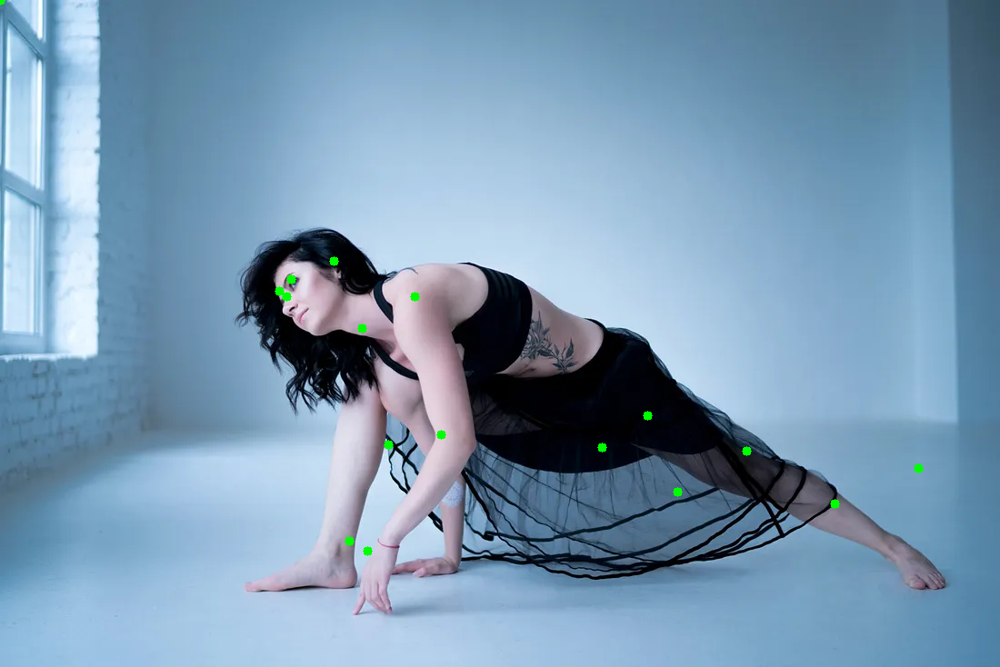

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread("dance.jpg")
for result in results:
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
      keypoint = kpts.xy[0, i]
      x, y = int(keypoint[0].item()), int(keypoint[1].item())
      cv2.circle(img, (x, y), 5, (0, 255, 0), -1)

cv2_imshow(img)

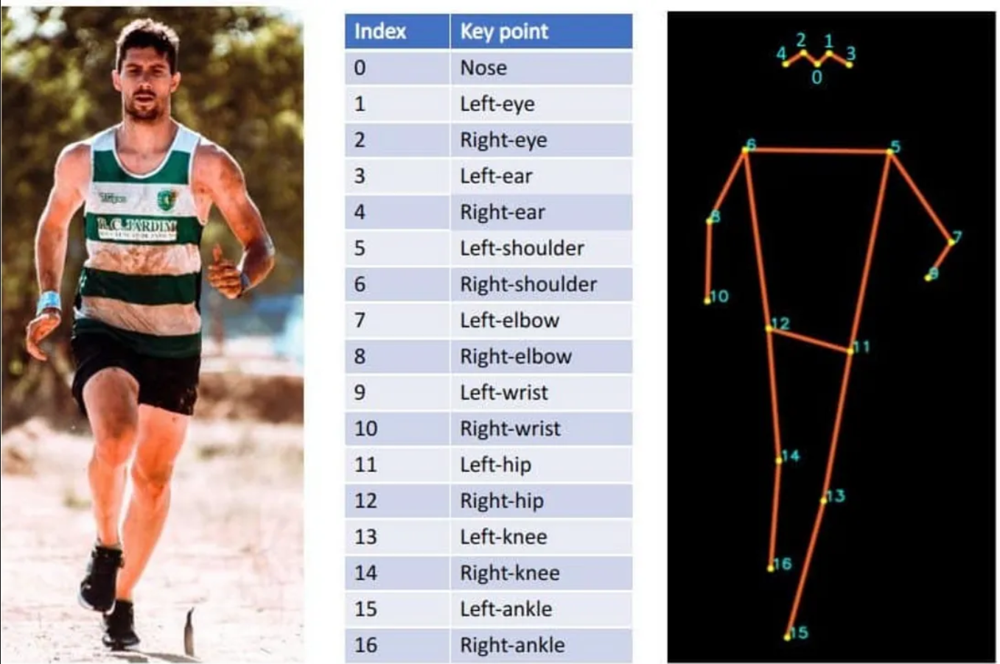

In [ ]:
"""
# Keypoints
kpt_shape: [17, 3]  # number of keypoints, number of dims (2 for x,y or 3 for x,y,visible)
flip_idx: [0, 2, 1, 4, 3, 6, 5, 8, 7, 10, 9, 12, 11, 14, 13, 16, 15]

# Classes
names:
  0: person

In [ ]:
# Export the model
model.export(format='TensorRT')  ## with GPU only


image 1/1 /content/Q5_pose.png: 384x640 4 persons, 193.6ms
Speed: 3.0ms preprocess, 193.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

 4 Persons detected.


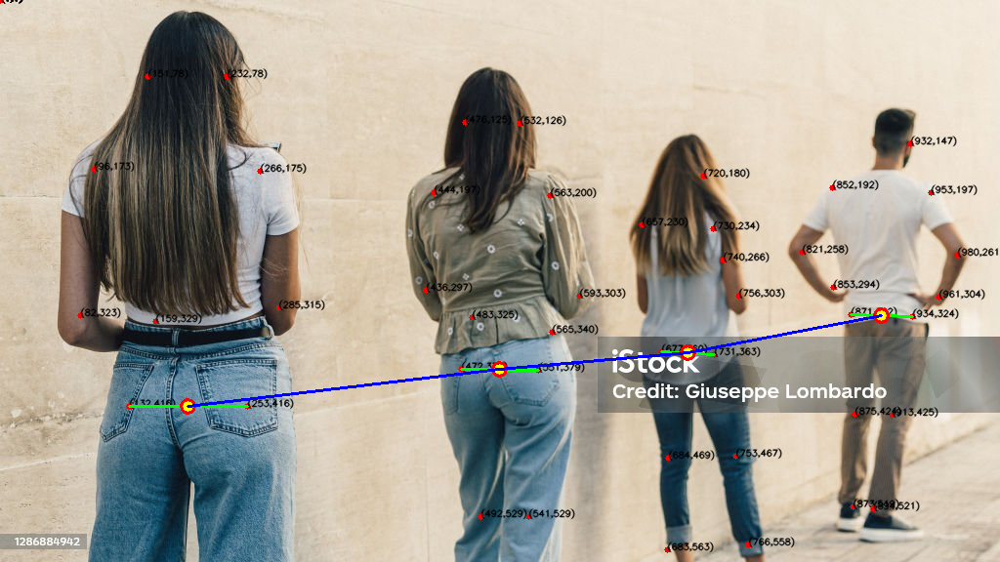

In [ ]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

# Load a model
model = YOLO('yolov8n-pose.pt')

img = cv2.imread("Q5_pose.png")
results = model.predict("Q5_pose.png")[0]

Q = []
for result in results:
  landmarks = []
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
    keypoint = kpts.xy[0, i]
    x, y = int(keypoint[0].item()), int(keypoint[1].item())
    cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
    ttext = "("+str(x)+","+str(y)+")"
    cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX,
                  0.3, (0,0,0), 1, cv2.LINE_AA)

    landmarks.append([x,y])

  cv2.line(img, landmarks[11], landmarks[12], (0,255,0), 2)
  a = (landmarks[11][0] + landmarks[12][0])//2
  b = (landmarks[11][1] + landmarks[12][1])//2
  #print(a," ",b)
  cv2.circle(img, (a, b), 5, (0, 255, 255), -1)
  cv2.circle(img, (a, b), 7, (0, 0, 255), 2)
  Q.append([a,b])

k, _, _ = results.keypoints.xy.cpu().numpy().shape
i=0
while i<(k-1):
  cv2.line(img, sorted(Q)[i], sorted(Q)[i+1], (255, 0,0), 2)
  i = i + 1

print("\n", k, "Persons detected.")
cv2_imshow(img)

100%|██████████| 6.51M/6.51M [00:00<00:00, 233MB/s]



image 1/1 /content/Q3_pose.png: 448x640 13 persons, 511.7ms
Speed: 18.2ms preprocess, 511.7ms inference, 33.6ms postprocess per image at shape (1, 3, 448, 640)

 9 Persons detected.


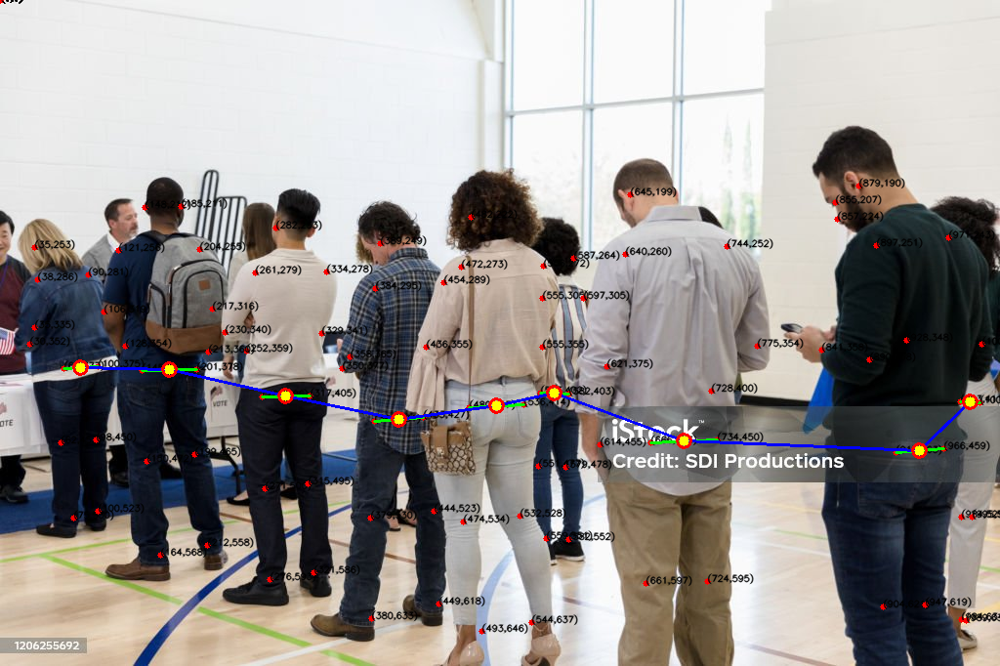

In [ ]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import pandas as pd

def significant_pose_detection(arr, th):
  n = len(arr)
  i=0
  for itemm in arr:
    if np.sum(itemm[0]+itemm[1])!=0:
      i = i + 1

  sig_det = (i/n)
  if sig_det>=th:
    return 1

  return 0


# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose.png"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
  landmarks = []
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
    keypoint = kpts.xy[0, i]
    x, y = int(keypoint[0].item()), int(keypoint[1].item())
    landmarks.append([x,y])

  # Create a NumPy Array from list
  detections = significant_pose_detection(landmarks, th)
  if detections==1:
    det = det + 1
    for j in range(len(landmarks)):
      x = landmarks[j][0]
      y = landmarks[j][1]
      cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
      ttext = "("+str(x)+","+str(y)+")"
      cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,0,0), 1, cv2.LINE_AA)

    # Calling DataFrame constructor on list
    df = pd.DataFrame(landmarks, columns =['x'+str(det), 'y'+str(det)], dtype = float)
    concat_df = pd.concat([concat_df, df], axis=1)

    cv2.line(img, landmarks[11], landmarks[12], (0,255,0), 2)
    a = (landmarks[11][0] + landmarks[12][0])//2
    b = (landmarks[11][1] + landmarks[12][1])//2
    #print(a," ",b)
    #cv2.circle(img, (a, b), 5, (0, 255, 255), -1)
    #cv2.circle(img, (a, b), 7, (0, 0, 255), 2)
    Q.append([a,b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
# Remove empty List from List
# using list comprehension
nQ = [ele for ele in m if ele != []]

#k, _, _ = results.keypoints.xy.cpu().numpy().shape
k = len(nQ)  # actual detected person after discarding zeros

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(img, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
  i = i + 1

# dataframe to csv
concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns =['x', 'y'], dtype = int)
df_nQ.to_csv('nQ_centroids.csv')


print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)

In [ ]:
concat_df

,x1,y1,x2,y2,x3,y3,x4,y4,x5,y5,x6,y6,x7,y7,x8,y8,x9,y9
0,0.0,0.0,857.0,224.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,855.0,207.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,645.0,199.0,879.0,190.0,282.0,233.0,148.0,212.0,35.0,253.0,389.0,249.0,482.0,222.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,185.0,211.0,0.0,0.0,0.0,0.0,0.0,0.0,587.0,264.0,0.0,0.0
5,640.0,260.0,897.0,251.0,261.0,279.0,121.0,256.0,38.0,286.0,384.0,295.0,472.0,273.0,555.0,305.0,0.0,0.0
6,744.0,252.0,971.0,243.0,334.0,278.0,204.0,255.0,90.0,281.0,454.0,289.0,556.0,272.0,597.0,305.0,0.0,0.0
7,621.0,375.0,890.0,368.0,230.0,340.0,106.0,319.0,35.0,335.0,358.0,365.0,436.0,355.0,0.0,0.0,0.0,0.0
8,775.0,354.0,1005.0,352.0,329.0,341.0,217.0,316.0,0.0,0.0,0.0,0.0,555.0,355.0,0.0,0.0,0.0,0.0
9,614.0,455.0,841.0,358.0,252.0,359.0,128.0,354.0,30.0,352.0,350.0,377.0,0.0,0.0,0.0,0.0,0.0,0.0


682 1024
[[82, 376], [173, 378], [292, 405], [408, 429], [508, 415], [567, 402], [700, 451], [941, 461], [993, 411]]


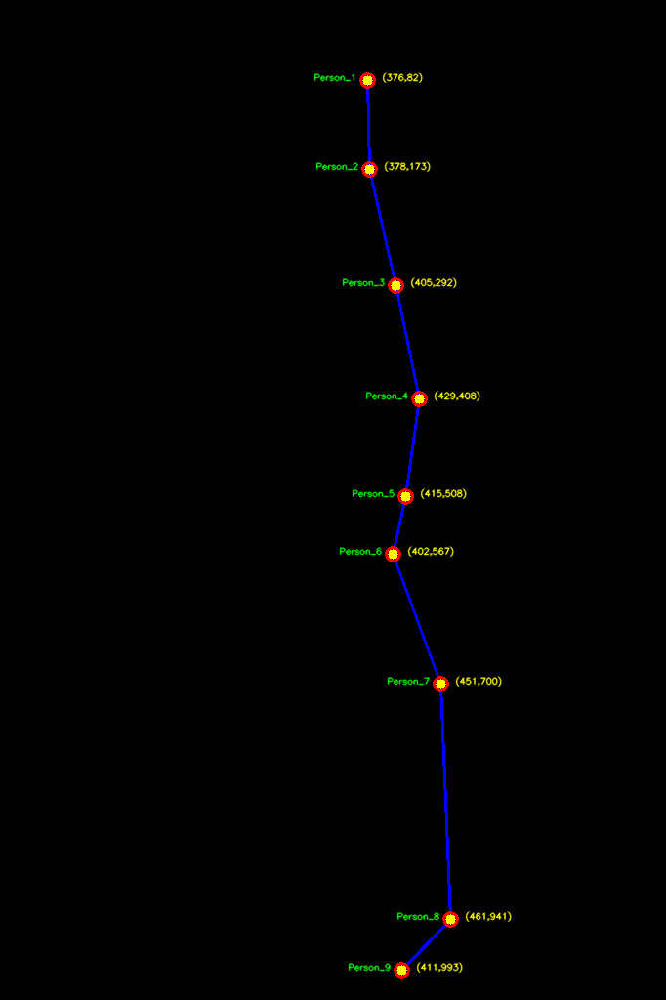

In [ ]:
image_file_name = "output.jpg"
src = cv2.imread(image_file_name)
h,w,c = src.shape
print(h,w)
canva = np.zeros([h,w,3],dtype=np.uint8)  # change the h, w
print(nQ)

nQT = [[itemm[1],itemm[0]] for itemm in nQ]

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(canva, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(canva, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(canva, nQ[i], 7, (0, 0, 255), 2)
  ttext = "("+str(nQ[i][0])+","+str(nQ[i][1])+")"

  i = i + 1

canva = cv2.rotate(canva, cv2.ROTATE_90_CLOCKWISE)
## ---------------------------------------------------------------------
# Use Flip code 0 to flip vertically
image = cv2.flip(canva, 1)
i = 0
while i<k:
  ttext = "("+str(nQT[i][0])+","+str(nQT[i][1])+")"
  cv2.putText(image, ttext, (nQ[i][1]+15, nQ[i][0]), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0,255,255), 1, cv2.LINE_AA)
  cv2.putText(image, "Person_"+str(i+1), (nQT[i][0]-55, nQT[i][1]), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,255,0), 1, cv2.LINE_AA)
  i = i + 1

cv2.imwrite("canvas.jpg", image)
cv2_imshow(image)

In [ ]:
import cv2

def merge_image(back, front, x,y):
    # convert to rgba
    if back.shape[2] == 3:
        back = cv2.cvtColor(back, cv2.COLOR_BGR2BGRA)
    if front.shape[2] == 3:
        front = cv2.cvtColor(front, cv2.COLOR_BGR2BGRA)

    # crop the overlay from both images
    bh,bw = back.shape[:2]
    fh,fw = front.shape[:2]
    x1, x2 = max(x, 0), min(x+fw, bw)
    y1, y2 = max(y, 0), min(y+fh, bh)
    front_cropped = front[y1-y:y2-y, x1-x:x2-x]
    back_cropped = back[y1:y2, x1:x2]

    alpha_front = front_cropped[:,:,3:4] / 255
    alpha_back = back_cropped[:,:,3:4] / 255

    # replace an area in result with overlay
    result = back.copy()
    print(f'af: {alpha_front.shape}\nab: {alpha_back.shape}\nfront_cropped: {front_cropped.shape}\nback_cropped: {back_cropped.shape}')
    result[y1:y2, x1:x2, :3] = alpha_front * front_cropped[:,:,:3] + (1-alpha_front) * back_cropped[:,:,:3]
    result[y1:y2, x1:x2, 3:4] = (alpha_front + alpha_back) / (1 + alpha_front*alpha_back) * 255

    return result

af: (200, 300, 1)
ab: (200, 300, 1)
front_cropped: (200, 300, 4)
back_cropped: (200, 300, 4)


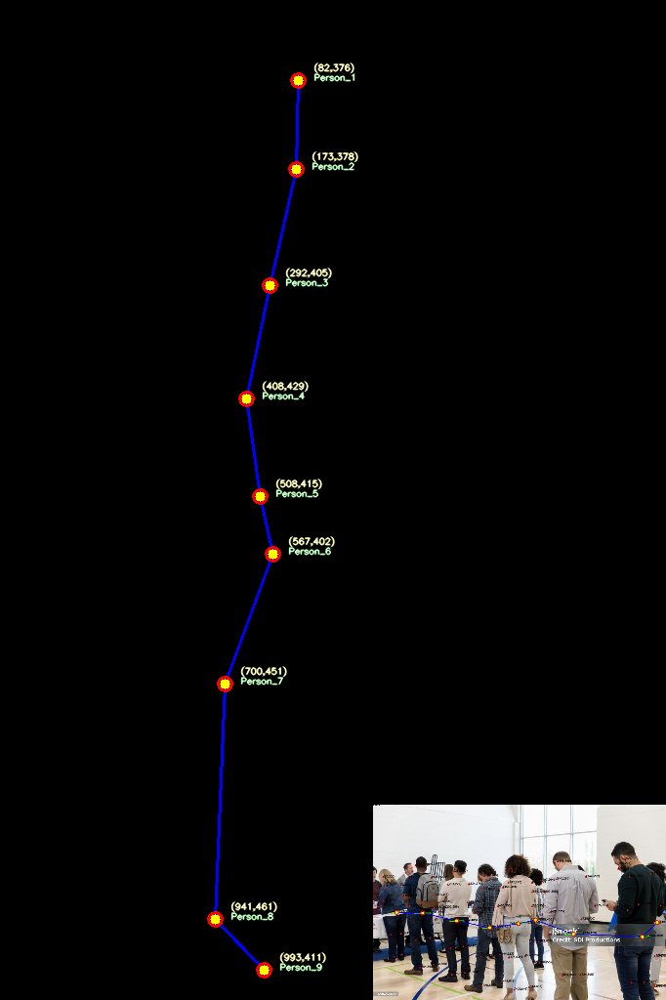

In [ ]:
image_file_name = "output.jpg"
src = cv2.imread(image_file_name)
h, w, _ = canva.shape
img_resize = cv2.resize(src, (300,200))
canva = merge_image(canva, img_resize, w-300,h-200)

cv2_imshow(canva)

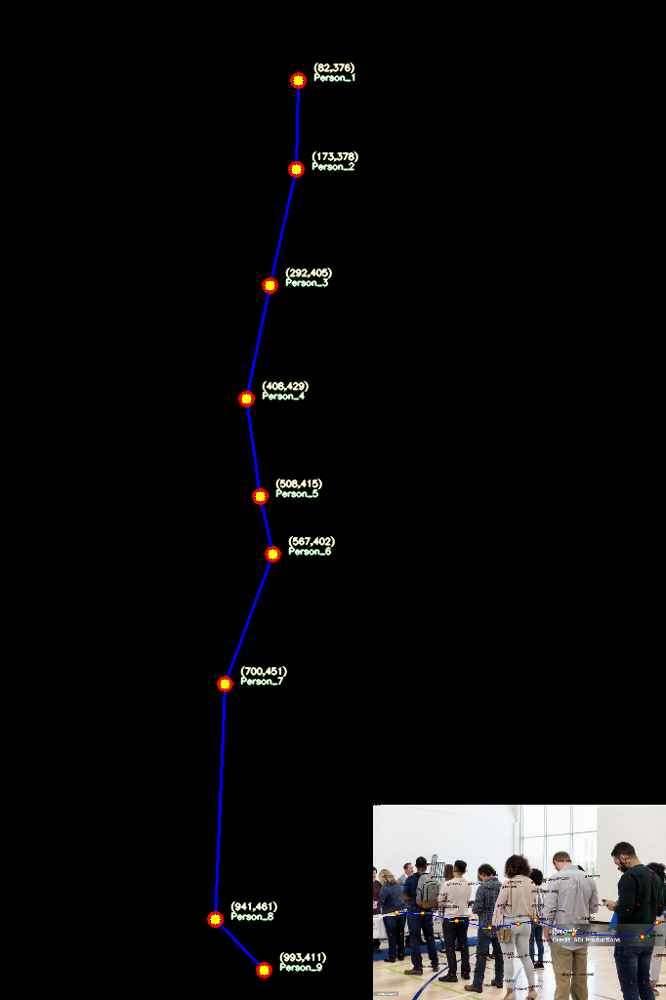

In [ ]:
i = 0

while i<k:
  ttext = "("+str(nQ[i][0])+","+str(nQ[i][1])+")"
  cv2.putText(canva, ttext, (w-nQ[i][1]+15, nQ[i][0]-10), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0,255,255), 1, cv2.LINE_AA)
  cv2.putText(canva, "Person_"+str(i+1), (w-nQ[i][1]+15, nQ[i][0]), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,255,0), 1, cv2.LINE_AA)
  i = i + 1

cv2.imwrite("canvas_orig.jpg", canva)
cv2_imshow(canva)

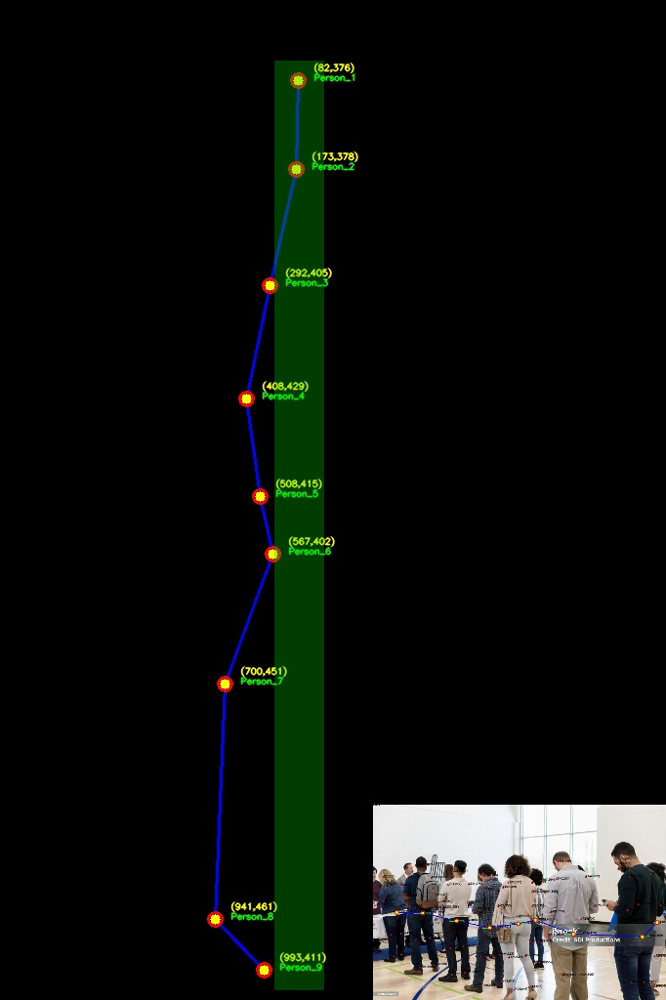

In [ ]:
image = cv2.imread('canvas_orig.jpg')
overlay = image.copy()

# Rectangle parameters
x, y, w1, h1 = w-nQT[0][0]-25, nQT[0][1]-20, 50, nQT[k-1][1]-nQT[0][1]+40
# A filled rectangle
cv2.rectangle(overlay, (x, y), (x+w1, y+h1), (0, 200, 0), -1)

alpha = 0.3  # Transparency factor.

# Following line overlays transparent rectangle
# over the image
image_new = cv2.addWeighted(overlay, alpha, image, 1 - alpha, 0)

cv2_imshow(image_new)

# **Start Here...**


image 1/1 /content/Q3_pose.png: 448x640 13 persons, 593.4ms
Speed: 15.2ms preprocess, 593.4ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)

 9 Persons detected.


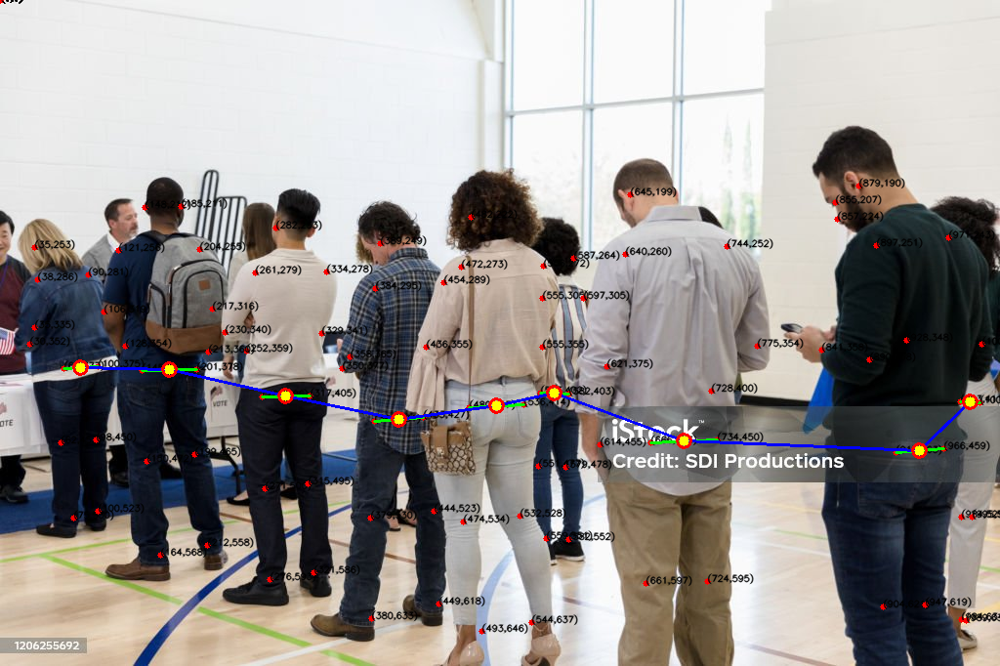

af: (200, 300, 1)
ab: (200, 300, 1)
front_cropped: (200, 300, 4)
back_cropped: (200, 300, 4)


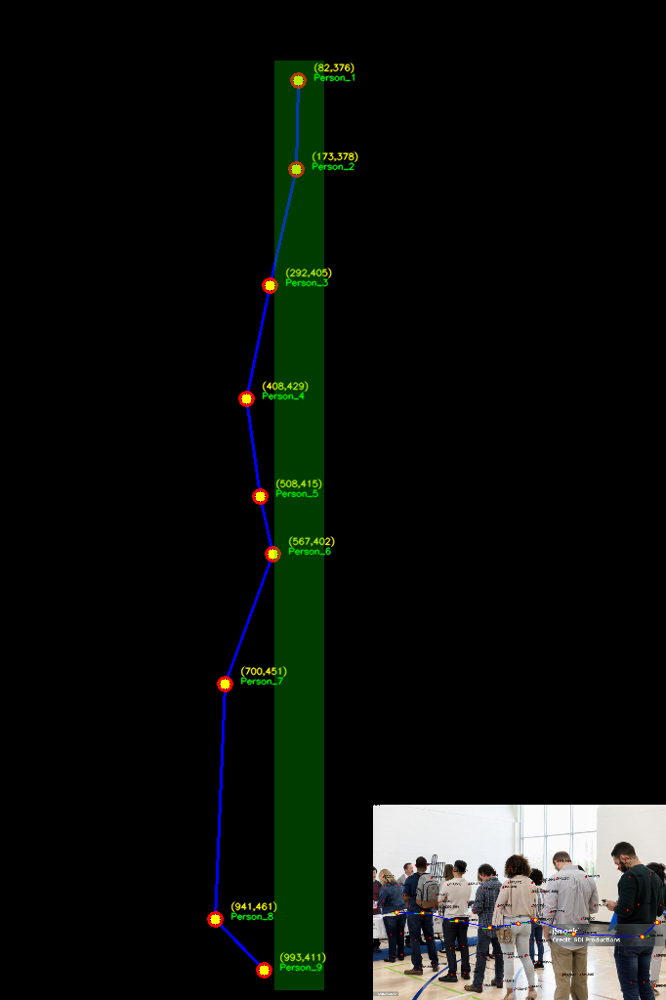

In [ ]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import pandas as pd

def significant_pose_detection(arr, th):
  n = len(arr)
  i=0
  for itemm in arr:
    if np.sum(itemm[0]+itemm[1])!=0:
      i = i + 1

  sig_det = (i/n)
  if sig_det>=th:
    return 1

  return 0


def merge_image(back, front, x,y):
    # convert to rgba
    if back.shape[2] == 3:
        back = cv2.cvtColor(back, cv2.COLOR_BGR2BGRA)
    if front.shape[2] == 3:
        front = cv2.cvtColor(front, cv2.COLOR_BGR2BGRA)

    # crop the overlay from both images
    bh,bw = back.shape[:2]
    fh,fw = front.shape[:2]
    x1, x2 = max(x, 0), min(x+fw, bw)
    y1, y2 = max(y, 0), min(y+fh, bh)
    front_cropped = front[y1-y:y2-y, x1-x:x2-x]
    back_cropped = back[y1:y2, x1:x2]

    alpha_front = front_cropped[:,:,3:4] / 255
    alpha_back = back_cropped[:,:,3:4] / 255

    # replace an area in result with overlay
    result = back.copy()
    print(f'af: {alpha_front.shape}\nab: {alpha_back.shape}\nfront_cropped: {front_cropped.shape}\nback_cropped: {back_cropped.shape}')
    result[y1:y2, x1:x2, :3] = alpha_front * front_cropped[:,:,:3] + (1-alpha_front) * back_cropped[:,:,:3]
    result[y1:y2, x1:x2, 3:4] = (alpha_front + alpha_back) / (1 + alpha_front*alpha_back) * 255

    return result


# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose.png"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
  landmarks = []
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
    keypoint = kpts.xy[0, i]
    x, y = int(keypoint[0].item()), int(keypoint[1].item())
    landmarks.append([x,y])

  # Create a NumPy Array from list
  detections = significant_pose_detection(landmarks, th)
  if detections==1:
    det = det + 1
    for j in range(len(landmarks)):
      x = landmarks[j][0]
      y = landmarks[j][1]
      cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
      ttext = "("+str(x)+","+str(y)+")"
      cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,0,0), 1, cv2.LINE_AA)

    # Calling DataFrame constructor on list
    df = pd.DataFrame(landmarks, columns =['x'+str(det), 'y'+str(det)], dtype = float)
    concat_df = pd.concat([concat_df, df], axis=1)

    cv2.line(img, landmarks[11], landmarks[12], (0,255,0), 2)
    a = (landmarks[11][0] + landmarks[12][0])//2
    b = (landmarks[11][1] + landmarks[12][1])//2
    #print(a," ",b)
    #cv2.circle(img, (a, b), 5, (0, 255, 255), -1)
    #cv2.circle(img, (a, b), 7, (0, 0, 255), 2)
    Q.append([a,b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
# Remove empty List from List
# using list comprehension
nQ = [ele for ele in m if ele != []]

#k, _, _ = results.keypoints.xy.cpu().numpy().shape
k = len(nQ)  # actual detected person after discarding zeros

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(img, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
  i = i + 1

# dataframe to csv
concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns =['x', 'y'], dtype = int)
df_nQ.to_csv('nQ_centroids.csv')

print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)
# -------------------------------------------------------------
h,w,c = img.shape
#print(h,w)
canva = np.zeros([h,w,3],dtype=np.uint8)  # change the h, w
#print(nQ)

nQT = [[itemm[1],itemm[0]] for itemm in nQ]

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(canva, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(canva, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(canva, nQ[i], 7, (0, 0, 255), 2)
  ttext = "("+str(nQ[i][0])+","+str(nQ[i][1])+")"

  i = i + 1

canva = cv2.rotate(canva, cv2.ROTATE_90_CLOCKWISE)

i = 0

while i<k:
  ttext = "("+str(nQ[i][0])+","+str(nQ[i][1])+")"
  cv2.putText(canva, ttext, (h-nQT[i][0]+15, nQT[i][1]-10), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0,255,255), 1, cv2.LINE_AA)
  cv2.putText(canva, "Person_"+str(i+1), (h-nQT[i][0]+15, nQT[i][1]), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,255,0), 1, cv2.LINE_AA)
  i = i + 1
# ---------------------------------------------------------
overlay = canva.copy()

# Rectangle parameters
x, y, w1, h1 = h-nQT[0][0]-25, nQT[0][1]-20, 50, nQT[k-1][1]-nQT[0][1]+40
# A filled rectangle
cv2.rectangle(overlay, (x, y), (x+w1, y+h1), (0, 200, 0), -1)

alpha = 0.3  # Transparency factor.

# Following line overlays transparent rectangle
# over the image
canva_new = cv2.addWeighted(overlay, alpha, canva, 1 - alpha, 0)

#cv2_imshow(canva_new)
# ----------------------------------------------------------
h, w, _ = canva_new.shape
img_resize = cv2.resize(img, (300,200))
canva = merge_image(canva_new, img_resize, w-300,h-200)

cv2.imwrite("canvas_orig.jpg", canva)
cv2_imshow(canva)

# **Original Code...START HERE...**


image 1/1 /content/Q3_pose.png: 448x640 13 persons, 217.0ms
Speed: 5.8ms preprocess, 217.0ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

 9 Persons detected.


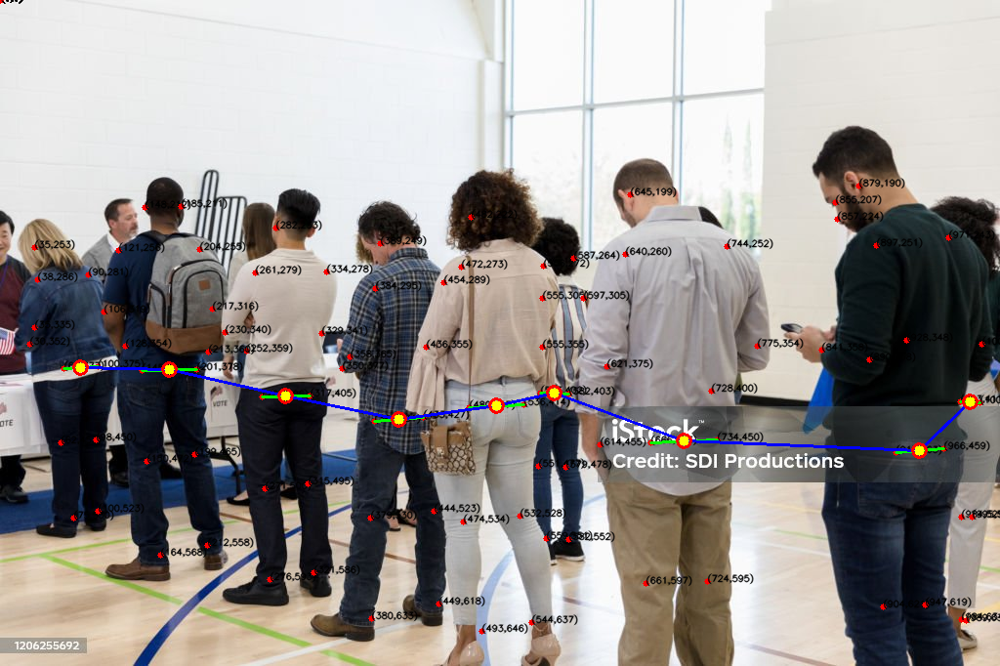

af: (200, 300, 1)
ab: (200, 300, 1)
front_cropped: (200, 300, 4)
back_cropped: (200, 300, 4)


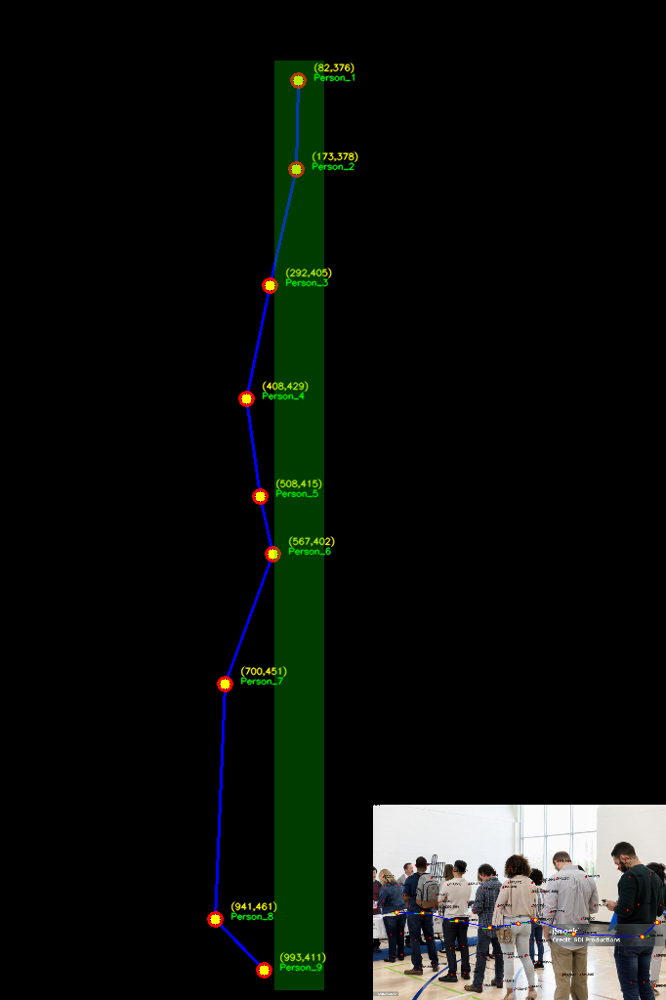

In [ ]:
import cv2
from ultralytics import YOLO
from google.colab.patches import cv2_imshow
from ultralytics import YOLO
import numpy as np
import pandas as pd

def significant_pose_detection(arr, th):
  n = len(arr)
  i=0
  for itemm in arr:
    if np.sum(itemm[0]+itemm[1])!=0:
      i = i + 1

  sig_det = (i/n)
  if sig_det>=th:
    return 1

  return 0


def merge_image(back, front, x,y):
    # convert to rgba
    if back.shape[2] == 3:
        back = cv2.cvtColor(back, cv2.COLOR_BGR2BGRA)
    if front.shape[2] == 3:
        front = cv2.cvtColor(front, cv2.COLOR_BGR2BGRA)

    # crop the overlay from both images
    bh,bw = back.shape[:2]
    fh,fw = front.shape[:2]
    x1, x2 = max(x, 0), min(x+fw, bw)
    y1, y2 = max(y, 0), min(y+fh, bh)
    front_cropped = front[y1-y:y2-y, x1-x:x2-x]
    back_cropped = back[y1:y2, x1:x2]

    alpha_front = front_cropped[:,:,3:4] / 255
    alpha_back = back_cropped[:,:,3:4] / 255

    # replace an area in result with overlay
    result = back.copy()
    print(f'af: {alpha_front.shape}\nab: {alpha_back.shape}\nfront_cropped: {front_cropped.shape}\nback_cropped: {back_cropped.shape}')
    result[y1:y2, x1:x2, :3] = alpha_front * front_cropped[:,:,:3] + (1-alpha_front) * back_cropped[:,:,:3]
    result[y1:y2, x1:x2, 3:4] = (alpha_front + alpha_back) / (1 + alpha_front*alpha_back) * 255

    return result


# Load a model
model = YOLO('yolov8n-pose.pt')

image_file_name = "Q3_pose.png"
img = cv2.imread(image_file_name)
results = model.predict(image_file_name)[0]
th = 0.3

Q = []
det = 0
concat_df = pd.DataFrame()

for result in results:
  landmarks = []
  kpts = result.keypoints
  nk = kpts.shape[1]

  for i in range(nk):
    keypoint = kpts.xy[0, i]
    x, y = int(keypoint[0].item()), int(keypoint[1].item())
    landmarks.append([x,y])

  # Create a NumPy Array from list
  detections = significant_pose_detection(landmarks, th)
  if detections==1:
    det = det + 1
    for j in range(len(landmarks)):
      x = landmarks[j][0]
      y = landmarks[j][1]
      cv2.circle(img, (x, y), 3, (0, 0, 255), -1)
      ttext = "("+str(x)+","+str(y)+")"
      cv2.putText(img, ttext, (x, y), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,0,0), 1, cv2.LINE_AA)

    # Calling DataFrame constructor on list
    df = pd.DataFrame(landmarks, columns =['x'+str(det), 'y'+str(det)], dtype = float)
    concat_df = pd.concat([concat_df, df], axis=1)

    cv2.line(img, landmarks[11], landmarks[12], (0,255,0), 2)
    a = (landmarks[11][0] + landmarks[12][0])//2
    b = (landmarks[11][1] + landmarks[12][1])//2
    #print(a," ",b)
    #cv2.circle(img, (a, b), 5, (0, 255, 255), -1)
    #cv2.circle(img, (a, b), 7, (0, 0, 255), 2)
    Q.append([a,b])

m = list(map(lambda l: [v for v in l if v != 0], sorted(Q)))
# Remove empty List from List
# using list comprehension
nQ = [ele for ele in m if ele != []]

#k, _, _ = results.keypoints.xy.cpu().numpy().shape
k = len(nQ)  # actual detected person after discarding zeros

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(img, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(img, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(img, nQ[i], 7, (0, 0, 255), 2)
  i = i + 1

# dataframe to csv
concat_df.to_csv('detected_pose.csv')
df_nQ = pd.DataFrame(nQ, columns =['x', 'y'], dtype = int)
df_nQ.to_csv('nQ_centroids.csv')

print("\n", k, "Persons detected.")
cv2.imwrite("output.jpg", img)
cv2_imshow(img)
# -------------------------------------------------------------
h,w,c = img.shape
#print(h,w)
canva = np.zeros([h,w,3],dtype=np.uint8)  # change the h, w
#print(nQ)

nQT = [[itemm[1],itemm[0]] for itemm in nQ]

# draw lines between persons
i=0
while i<(k-1):
  cv2.line(canva, nQ[i], nQ[i+1], (255, 0,0), 2)
  i = i + 1

# draw centroids for each person
i = 0
while i<k:
  cv2.circle(canva, nQ[i], 5, (0, 255, 255), -1)
  cv2.circle(canva, nQ[i], 7, (0, 0, 255), 2)
  ttext = "("+str(nQ[i][0])+","+str(nQ[i][1])+")"

  i = i + 1

canva = cv2.rotate(canva, cv2.ROTATE_90_CLOCKWISE)

i = 0

while i<k:
  ttext = "("+str(nQ[i][0])+","+str(nQ[i][1])+")"
  cv2.putText(canva, ttext, (h-nQT[i][0]+15, nQT[i][1]-10), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (0,255,255), 1, cv2.LINE_AA)
  cv2.putText(canva, "Person_"+str(i+1), (h-nQT[i][0]+15, nQT[i][1]), cv2.FONT_HERSHEY_SIMPLEX,
                    0.3, (0,255,0), 1, cv2.LINE_AA)
  i = i + 1
# ---------------------------------------------------------
overlay = canva.copy()

# Rectangle parameters
x, y, w1, h1 = h-nQT[0][0]-25, nQT[0][1]-20, 50, nQT[k-1][1]-nQT[0][1]+40
# A filled rectangle
cv2.rectangle(overlay, (x, y), (x+w1, y+h1), (0, 200, 0), -1)

alpha = 0.3  # Transparency factor.

# Following line overlays transparent rectangle
# over the image
canva_new = cv2.addWeighted(overlay, alpha, canva, 1 - alpha, 0)

#cv2_imshow(canva_new)
# ----------------------------------------------------------
h, w, _ = canva_new.shape
img_resize = cv2.resize(img, (300,200))
canva = merge_image(canva_new, img_resize, w-300,h-200)

cv2.imwrite("canvas_orig.jpg", canva)
cv2_imshow(canva)

In [ ]:
x = [float(itemm[0]) for itemm in nQ]
y = [float(itemm[1]) for itemm in nQ]
print(nQ)
print(x)
print(y)

[[82, 376], [173, 378], [292, 405], [408, 429], [508, 415], [567, 402], [700, 451], [941, 461], [993, 411]]
[82.0, 173.0, 292.0, 408.0, 508.0, 567.0, 700.0, 941.0, 993.0]
[376.0, 378.0, 405.0, 429.0, 415.0, 402.0, 451.0, 461.0, 411.0]


In [ ]:
min(x)

82.0

https://how-to-data.org/how-to-compute-a-confidence-interval-for-a-regression-coefficient-in-python-using-statsmodels/

In [ ]:
import statsmodels.api as sm

#xs = [  34,   9,  78,  60,  22,  45,  83,  59,  25 ]
#ys = [ 126, 347, 298, 309, 450, 187, 266, 385, 400 ]
# import data
url = 'nQ_centroids.csv'
data = pd.read_csv(url)
xs = data['x'].values
ys = data['y'].values
print("x: ",xs,"y: ",ys)

xs = sm.add_constant( xs )
model = sm.OLS( ys, xs )
results = model.fit()

results.conf_int( alpha=0.05 )

# Each list in the array represents the 95% confidence interval for the corresponding coefficient in the
# model beginning with the intercept and each regression coefficient thereafter. Accordingly, the 95%
# confidence interval for the regression coefficient is [-1.81774867e-01, -7.08763191e-02].

x:  [ 82 173 292 408 508 567 700 941 993] y:  [376 378 405 429 415 402 451 461 411]


array([[     346.24,      413.37],
       [   0.010387,     0.12245]])

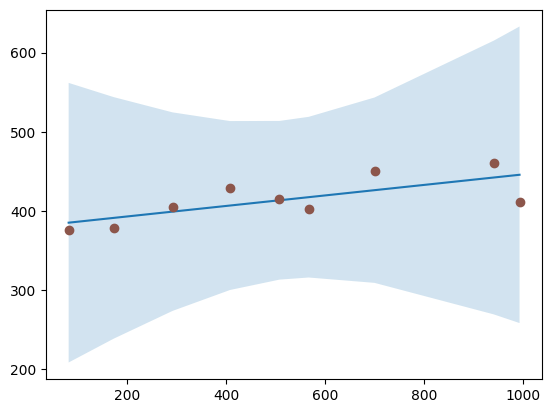

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# fit a linear curve and estimate its y-values and their error.
a, b = np.polyfit(x, y, deg=1)
x = np.array(x)
y_est = a * x + b
y_err = x.std() * np.sqrt(1/len(x) +
                          (x - x.mean())**2 / np.sum((x - x.mean())**2))

fig, ax = plt.subplots()
ax.plot(x, y_est, '-')
ax.fill_between(x, y_est - y_err, y_est + y_err, alpha=0.2)
ax.plot(x, y, 'o', color='tab:brown')

# **Best Confidence Interval...**

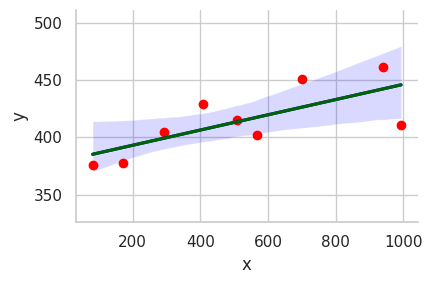

In [ ]:
import pandas

#x = [5, 3, 6, 3, 4, 4, 6, 8]
#y = [13, 15, 7, 12, 13, 11, 9, 5]
d = pandas.DataFrame({'x':x, 'y': y})

import seaborn
import matplotlib.pyplot as plt

seaborn.set(style = 'whitegrid')
p = seaborn.FacetGrid(d, aspect = 1.5)

p.map(seaborn.regplot, 'x', 'y', scatter = False, ci = 95,
    fit_reg = True, color = 'blue')
p.map(seaborn.regplot, 'x', 'y', scatter = False, ci = 0,
    fit_reg = True, color = 'darkgreen')
p.map(plt.scatter, 'x', 'y', color = 'red')

p.set(xlim = (min(x)-50, max(x)+50))
p.set(ylim = (min(y)-50, max(y)+50))
p.savefig('xy-regression-ci.pdf', bbox_inches='tight')

x:  [ 82 173 292 408 508 567 700 941 993] y:  [376 378 405 429 415 402 451 461 411]


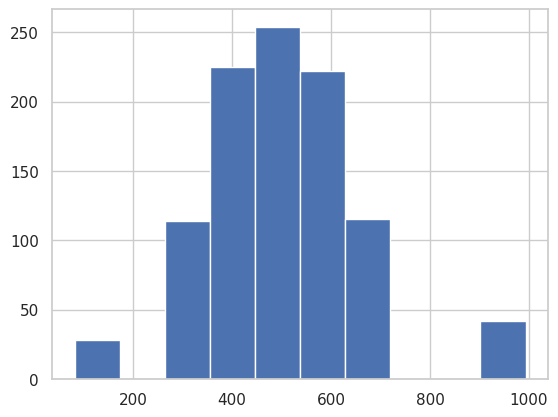


95.0 confidence interval 173.0 and 941.0


In [ ]:
# import libraries
import pandas
import numpy
from sklearn.utils import resample
from sklearn.metrics import accuracy_score
from matplotlib import pyplot as plt

# import data
url = 'nQ_centroids.csv'
data = pd.read_csv(url)
x = data['x'].values
y = data['y'].values
print("x: ",x,"y: ",y)
# load dataset
x = numpy.array(x)

# configure bootstrap
n_iterations = 1000 # here k=no. of bootstrapped samples
n_size = int(len(x))

# run bootstrap
medians = list()
for i in range(n_iterations):
  s = resample(x, n_samples=n_size);
  m = numpy.median(s);
  medians.append(m)

# plot scores
plt.hist(medians)
plt.show()

# confidence intervals
alpha = 0.95
p = ((1.0-alpha)/2.0) * 100
lower = numpy.percentile(medians, p)
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = numpy.percentile(medians, p)

print(f"\n{alpha*100} confidence interval {lower} and {upper}")

https://apmonitor.com/che263/index.php/Main/PythonRegressionStatistics#:~:text=Linear%20Regression&text=The%20confidence%20band%20is%20the,falls%20within%20the%20prediction%20band.

x:  [ 82 173 292 408 508 567 700 941 993] y:  [376 378 405 429 415 402 451 461 411]
Optimal Values
a: 0.06641868199591794
b: 379.80258524099753
R^2: 0.5288319965131703
Uncertainty
a: 0.066+/-0.024
b: 380+/-14


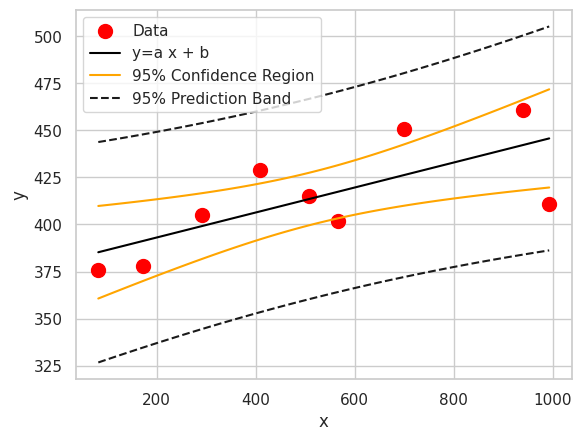

In [ ]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
from scipy import stats
import pandas as pd

# pip install uncertainties, if needed
try:
    import uncertainties.unumpy as unp
    import uncertainties as unc
except:
    try:
        from pip import main as pipmain
    except:
        from pip._internal import main as pipmain
    pipmain(['install','uncertainties'])
    import uncertainties.unumpy as unp
    import uncertainties as unc

# import data
url = 'nQ_centroids.csv'
data = pd.read_csv(url)
x = data['x'].values
y = data['y'].values
print("x: ",x,"y: ",y)
n = len(y)

def f(x, a, b):
    return a * x + b

popt, pcov = curve_fit(f, x, y)

# retrieve parameter values
a = popt[0]
b = popt[1]
print('Optimal Values')
print('a: ' + str(a))
print('b: ' + str(b))

# compute r^2
r2 = 1.0-(sum((y-f(x,a,b))**2)/((n-1.0)*np.var(y,ddof=1)))
print('R^2: ' + str(r2))

# calculate parameter confidence interval
a,b = unc.correlated_values(popt, pcov)
print('Uncertainty')
print('a: ' + str(a))
print('b: ' + str(b))

# plot data
plt.scatter(x, y, s=100, label='Data', color = 'red')

# calculate regression confidence interval
px = np.linspace(min(x), max(x), 100)
py = a*px+b
nom = unp.nominal_values(py)
std = unp.std_devs(py)

def predband(x, xd, yd, p, func, conf=0.95):
    # x = requested points
    # xd = x data
    # yd = y data
    # p = parameters
    # func = function name
    alpha = 1.0 - conf    # significance
    N = xd.size          # data sample size
    var_n = len(p)  # number of parameters
    # Quantile of Student's t distribution for p=(1-alpha/2)
    q = stats.t.ppf(1.0 - alpha / 2.0, N - var_n)
    # Stdev of an individual measurement
    se = np.sqrt(1. / (N - var_n) * \
                 np.sum((yd - func(xd, *p)) ** 2))
    # Auxiliary definitions
    sx = (x - xd.mean()) ** 2
    sxd = np.sum((xd - xd.mean()) ** 2)
    # Predicted values (best-fit model)
    yp = func(x, *p)
    # Prediction band
    dy = q * se * np.sqrt(1.0+ (1.0/N) + (sx/sxd))
    # Upper & lower prediction bands.
    lpb, upb = yp - dy, yp + dy
    return lpb, upb

lpb, upb = predband(px, x, y, popt, f, conf=0.95)

# plot the regression
plt.plot(px, nom, c='black', label='y=a x + b')

# uncertainty lines (95% confidence)
plt.plot(px, nom - 1.96 * std, c='orange',\
         label='95% Confidence Region')
plt.plot(px, nom + 1.96 * std, c='orange')
# prediction band (95% confidence)
plt.plot(px, lpb, 'k--',label='95% Prediction Band')
plt.plot(px, upb, 'k--')
plt.ylabel('y')
plt.xlabel('x')
plt.legend(loc='best')

# save and show figure
plt.savefig('regression.png')
plt.show()

x:  [ 82 173 292 408 508 567 700 941 993] y:  [376 378 405 429 415 402 451 461 411]


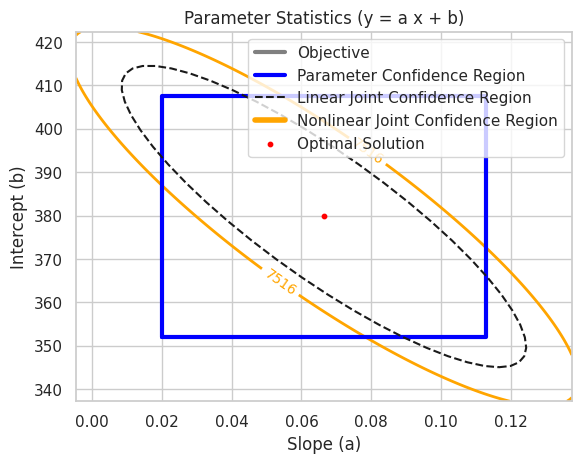

In [ ]:
import numpy as np
import scipy as sp
from scipy import stats
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import pandas as pd

# import data
url = 'nQ_centroids.csv'
data = pd.read_csv(url)
x = data['x'].values
y = data['y'].values
print("x: ",x,"y: ",y)

def f(x, a, b):
    return a * x + b

# perform regression
popt, pcov = curve_fit(f, x, y)

# retrieve parameter values
a = popt[0]
b = popt[1]

# calculate parameter stdev
s_a = np.sqrt(pcov[0,0])
s_b = np.sqrt(pcov[1,1])

# #####################################
# Single Variable Confidence Interval
# #####################################
# calculate 95% confidence interval
aL = a-1.96*s_a
aU = a+1.96*s_a
bL = b-1.96*s_b
bU = b+1.96*s_b

# calculate 3sigma interval
a3L = a-3.0*s_a
a3U = a+3.0*s_a
b3L = b-3.0*s_b
b3U = b+3.0*s_b

# #####################################
# Linear Joint Confidence Interval
#  thanks to Trent Okeson
# #####################################
eigenval, eigenvec = np.linalg.eig(pcov)
max_eigenval = np.argmax(eigenval)
largest_eigenvec = eigenvec[:, max_eigenval]
largest_eigenval = eigenval[max_eigenval]

if max_eigenval == 1:
    smallest_eigenval = eigenval[0]
    smallest_eigenvec = eigenvec[:, 0]
else:
    smallest_eigenval = eigenval[1]
    smallest_eigenvec = eigenvec[:, 1]

angle = np.arctan2(largest_eigenvec[1], largest_eigenvec[0])
if angle < 0:
    angle += 2*np.pi

chisquare_val = 2.4477
theta_grid = np.linspace(0, 2*np.pi)
phi = angle
a_rot = chisquare_val*np.sqrt(largest_eigenval)
b_rot = chisquare_val*np.sqrt(smallest_eigenval)

ellipse_x_r = a_rot*np.cos(theta_grid)
ellipse_y_r = b_rot*np.sin(theta_grid)

R = [[np.cos(phi), np.sin(phi)], [-np.sin(phi), np.cos(phi)]]

r_ellipse = np.stack((ellipse_x_r, ellipse_y_r)).T.dot(R)
final_ellipse = r_ellipse + popt[None, :]

# #####################################
# Nonlinear Joint Confidence Interval
# #####################################
# Generate contour plot of SSE ratio vs. Parameters
# meshgrid is +/- change in the objective value
m = 200

i1 = np.linspace(a3L,a3U,m)
i2 = np.linspace(b3L,b3U,m)
a_grid, b_grid = np.meshgrid(i1, i2)
n = len(y) # number of data points
p = 2      # number of parameters

# sum of squared errors
sse = np.empty((m,m))
for i in range(m):
    for j in range(m):
        at = a_grid[i,j]
        bt = b_grid[i,j]
        sse[i,j] = np.sum((y-f(x,at,bt))**2)

# normalize to the optimal solution
best_sse = np.sum((y-f(x,a,b))**2)
fsse = (sse - best_sse) / best_sse

# compute f-statistic for the f-test
alpha = 0.05 # alpha, confidence
             # alpha=0.05 is 95% confidence
fstat = sp.stats.f.isf(alpha,p,(n-p))
flim = fstat * p / (n-p)
obj_lim = flim * best_sse + best_sse

# Create a contour plot
plt.figure()
CS = plt.contour(a_grid,b_grid,sse,[1,2,5,10],\
                 colors='gray')
plt.clabel(CS, inline=1, fontsize=10)
plt.xlabel('Slope (a)')
plt.ylabel('Intercept (b)')
# solid line to show confidence region
CS = plt.contour(a_grid,b_grid,sse,[obj_lim],\
                 colors='orange',linewidths=[2.0])
plt.clabel(CS, inline=1, fontsize=10)

# 2 dummy plots (gray,orange) for legend
plt.plot([aL,aL],[bL,bL],c='gray',\
          linewidth=3,label='Objective')
plt.plot([aL,aU,aU,aL,aL],[bL,bL,bU,bU,bL],c='blue',\
          linewidth=3,label='Parameter Confidence Region')
plt.plot(final_ellipse[:, 0], final_ellipse[:, 1], 'k--',\
         label='Linear Joint Confidence Region')
plt.plot([aL,aL],[bL,bL],c='orange',\
          linewidth=4,\
          label='Nonlinear Joint Confidence Region')
plt.scatter(a,b,s=10,c='red',marker='o',\
            label='Optimal Solution')

plt.title('Parameter Statistics (y = a x + b)')
plt.legend(loc=1)

# Save the figure as a PNG
plt.savefig('contour.png')
plt.show()

In [ ]:
from scipy import stats
import numpy as np

# import data
url = 'nQ_centroids.csv'
data = pd.read_csv(url)
x = data['x'].values
y = data['y'].values
print("x: ",x,"y: ",y)

slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
confidence_interval = 2.58*std_err
confidence_interval

x:  [ 82 173 292 408 508 567 700 941 993] y:  [376 378 405 429 415 402 451 461 411]


0.06113500786965166

<ipython-input-72-e341b61e0a2a>:6: DeprecationWarning: Please use `pearsonr` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import pearsonr


x:  [ 82 173 292 408 508 567 700 941 993] y:  [376 378 405 429 415 402 451 461 411]
PearsonRResult(statistic=0.7272083583906134, pvalue=0.026410915442575147)


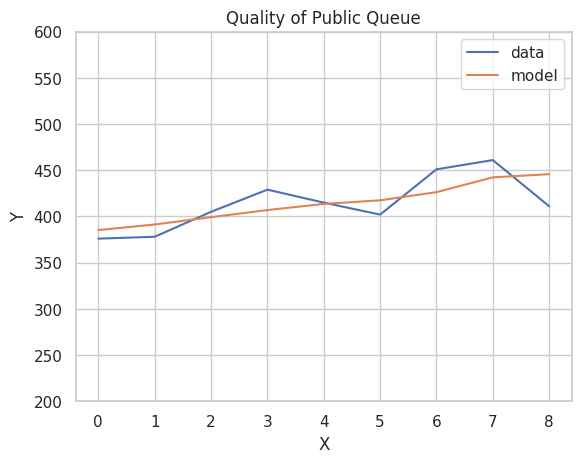

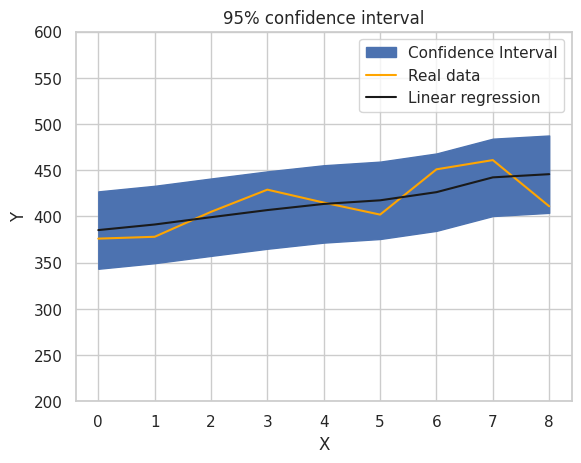

In [ ]:
#!/usr/bin/env python3
from sklearn.linear_model import LinearRegression
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats.stats import pearsonr
from scipy import stats

# import data
url = 'nQ_centroids.csv'
data = pd.read_csv(url)
x_data = data['x'].values
y_data = data['y'].values
print("x: ",x_data,"y: ",y_data)

correlation = pearsonr(x_data, y_data)
print(correlation)

lin_regression = LinearRegression().fit(np.array(x_data).reshape(-1, 1), np.array(y_data))
model_line = lin_regression.predict(np.array(x_data).reshape(-1, 1))


plt.plot(y_data, label='data')
plt.plot(model_line,label='model')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Quality of Public Queue')
plt.legend()
plt.ylim(200,600)
plt.show()
#plt.savefig('data.jpg', format='jpg')
plt.close()


def get_prediction_interval(prediction, y_test, test_predictions, pi=.95):
    '''
    Get a prediction interval for a linear regression.

    INPUTS:
        - Single prediction,
        - y_test
        - All test set predictions,
        - Prediction interval threshold (default = .95)
    OUTPUT:
        - Prediction interval for single prediction
    '''

    #get standard deviation of y_test
    sum_errs = np.sum((y_test - test_predictions)**2)
    stdev = np.sqrt(1 / (len(y_test) - 2) * sum_errs)
#get interval from standard deviation
    one_minus_pi = 1 - pi
    ppf_lookup = 1 - (one_minus_pi / 2)
    z_score = stats.norm.ppf(ppf_lookup)
    interval = z_score * stdev


#generate prediction interval lower and upper bound cs_24
    lower, upper = prediction - interval, prediction + interval
    return lower, prediction, upper


## Plot and save confidence interval of linear regression  - 95% cs_24
lower_vet = []
upper_vet = []

for i in model_line:
    lower, prediction, upper =  get_prediction_interval(i, y_data, model_line)
    lower_vet.append(lower)
    upper_vet.append(upper)

plt.fill_between(np.arange(0,len(y_data),1),upper_vet, lower_vet, color='b',label='Confidence Interval')
plt.plot(np.arange(0,len(y_data),1),y_data,color='orange',label='Real data')
plt.plot(model_line,'k',label='Linear regression')
plt.xlabel('X')
plt.ylabel('Y')
plt.title('95% confidence interval')
plt.legend()
plt.ylim(200,600)
plt.savefig('confid_int_cs24.eps', format='eps')
plt.show()

https://towardsdatascience.com/generating-confidence-intervals-for-regression-models-2dd60026fbce

Naive Method

In [ ]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_diabetes
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold

def generate_results_dataset(preds, ci):
    df = pd.DataFrame()
    df['prediction'] = preds
    if ci >= 0:
        df['upper'] = preds + ci
        df['lower'] = preds - ci
    else:
        df['upper'] = preds - ci
        df['lower'] = preds + ci

    return df

# import data
url = 'nQ_centroids.csv'
data = pd.read_csv(url)
x_data = np.array(data['x'].values)
y_data = np.array(data['y'].values)
print("x: ",x_data,"y: ",y_data)

rf = RandomForestRegressor(random_state=42)
rf.fit(x_data.reshape(-1, 1), y_data)
residuals = y_data - rf.predict(x_data.reshape(-1, 1))
ci = np.quantile(residuals, 1 - alpha)
preds = rf.predict(x_data.reshape(-1, 1))
df = generate_results_dataset(preds, ci)
df

x:  [ 82 173 292 408 508 567 700 941 993] y:  [376 378 405 429 415 402 451 461 411]


,prediction,upper,lower
0,381.96,395.152,368.768
1,382.58,395.772,369.388
2,405.01,418.202,391.818
3,421.63,434.822,408.438
4,413.44,426.632,400.248
5,409.90,423.092,396.708
6,439.59,452.782,426.398
7,446.62,459.812,433.428
8,422.62,435.812,409.428


The Jackknife

In [ ]:
X_train = x_data.reshape(-1, 1)
y_train = y_data
X_test = x_data.reshape(-1, 1)
y_test = y_data

kf = KFold(n_splits=len(y_train)-1, shuffle=True, random_state=42)
res = []
for train_index, test_index in kf.split(X_train):
    X_train_, X_test_ = X_train[train_index], X_train[test_index]
    y_train_, y_test_ = y_train[train_index], y_train[test_index]

    rf.fit(X_train_, y_train_)
    res.extend(list(y_test_ - rf.predict(X_test_)))

rf.fit(X_train, y_train)
ci = np.quantile(res, 1 - alpha)
preds = rf.predict(X_test)
df = generate_results_dataset(preds, ci)
df

,prediction,upper,lower
0,381.96,421.612,342.308
1,382.58,422.232,342.928
2,405.01,444.662,365.358
3,421.63,461.282,381.978
4,413.44,453.092,373.788
5,409.90,449.552,370.248
6,439.59,479.242,399.938
7,446.62,486.272,406.968
8,422.62,462.272,382.968


The Jackknife+ Method

In [ ]:
X_train = x_data.reshape(-1, 1)
y_train = y_data
X_test = x_data.reshape(-1, 1)
y_test = y_data

kf = KFold(n_splits=len(y_train)-1, shuffle=True, random_state=42)
res = []
estimators = []
for train_index, test_index in kf.split(X_train):
    X_train_, X_test_ = X_train[train_index], X_train[test_index]
    y_train_, y_test_ = y_train[train_index], y_train[test_index]

    rf.fit(X_train_, y_train_)
    estimators.append(rf)
    res.extend(list(y_test_ - rf.predict(X_test_)))

y_pred_multi = np.column_stack([e.predict(X_test) for e in estimators])

ci = np.quantile(res, 1 - alpha)
top = []
bottom = []
for i in range(y_pred_multi.shape[0]):
    if ci > 0:
        top.append(np.quantile(y_pred_multi[i] + ci, 1 - alpha))
        bottom.append(np.quantile(y_pred_multi[i] - ci, 1 - alpha))
    else:
        top.append(np.quantile(y_pred_multi[i] - ci, 1 - alpha))
        bottom.append(np.quantile(y_pred_multi[i] + ci, 1 - alpha))

preds = np.median(y_pred_multi, axis=1)
df = pd.DataFrame()
df['pred'] = preds
df['upper'] = top
df['lower'] = bottom
df

,pred,upper,lower
0,378.75,418.402,339.098
1,379.63,419.282,339.978
2,407.75,447.402,368.098
3,423.52,463.172,383.868
4,412.42,452.072,372.768
5,406.70,446.352,367.048
6,409.66,449.312,370.008
7,438.46,478.112,398.808
8,418.46,458.112,378.808


https://lmc2179.github.io/posts/confidence_prediction.html

x:  [ 82 173 292 408 508 567 700 941 993] y:  [376 378 405 429 415 402 451 461 411]


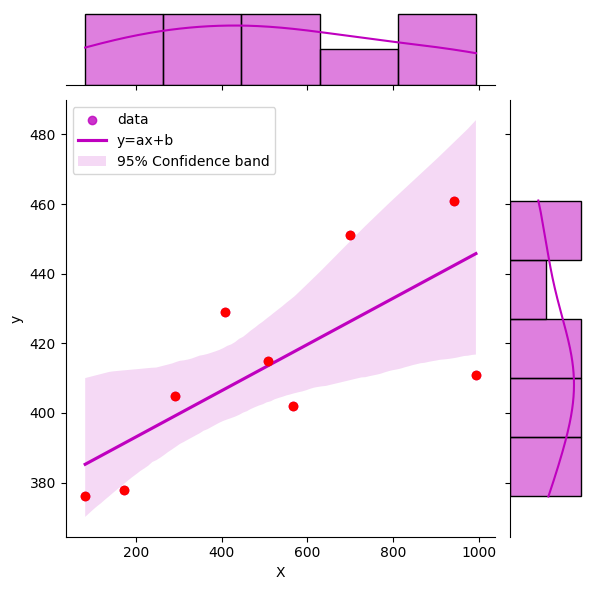

In [ ]:
import warnings
warnings.simplefilter("ignore")

import seaborn as sns
import pandas
%matplotlib inline

# import data
url = 'nQ_centroids.csv'
data = pd.read_csv(url)
x_data = np.array(data['x'].values)
y_data = np.array(data['y'].values)
print("x: ",x_data,"y: ",y_data)

X_train = x_data.reshape(-1,1)
y_train = y_data
X_test = x_data.reshape(-1,1)
y_test = y_data

df_train = pandas.DataFrame(dict(X=X_train.ravel(), y=y_train))
g = sns.jointplot(x='X', y='y', data=df_train.astype('int32'), kind='reg', color="m", height=6)
g.ax_joint.plot(X_test, y_test, 'ro');
with warnings.catch_warnings():
    plt.legend(labels=['data', 'y=ax+b', '95% Confidence band'], loc='upper left')